# <span style="color:RoyalBlue">CLASSIFICATION PREDICTION MODEL: BANK MARKETING CAMPAIGN </span>
### Data Scientist: Yogga Prastya Wijaya

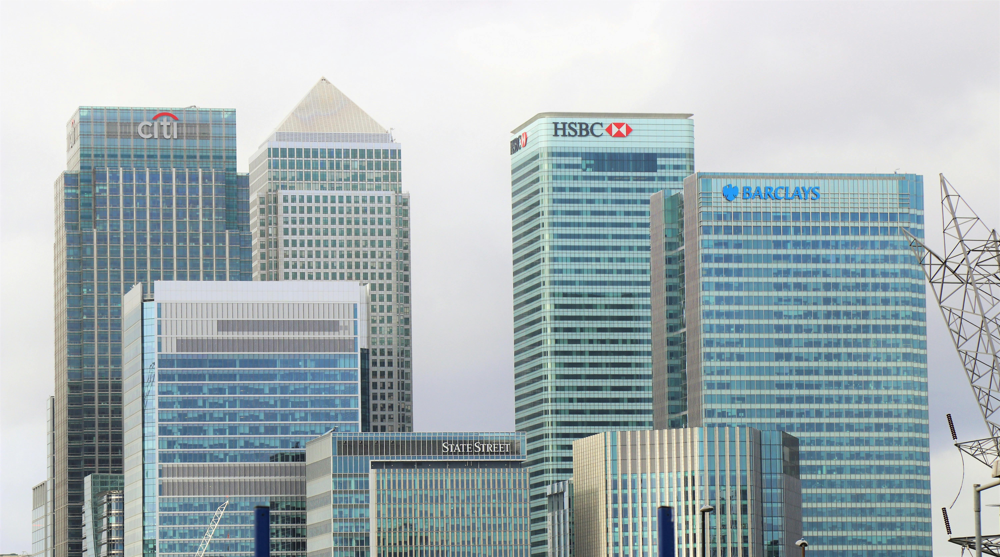

# <span style="color:RoyalBlue">Daftar Isi </span>
    
[**Business Problem Understanding**](#1.-Business-Problem-Understanding)

[**Data Understanding**](#-2.-Data-Understanding)

[**Data Preparation**](#3.-Data-Preparation)

[**Modeling & Evaluation**](#-4.-Modeling-&-Evaluation)

[**Conclusion & Recommendation**](#-5.-Conclusion-&-Recommendation-)

# <span style="color:RoyalBlue">Executive Summary</span>

Jenis produk keuangan yang digunakan oleh masyarakat semakin beragam, salah satunya adalah deposito berjangka. Dalam mekanisme ini, nasabah menyetorkan sejumlah uang ke bank atau lembaga keuangan yang hanya dapat ditarik setelah jangka waktu tertentu, dan sebagai kompensasi, nasabah akan menerima bunga tetap sesuai dengan nominal yang disetorkan. Namun, bank tetap harus bersaing agar tidak kehilangan pelanggan, dan salah satu cara untuk mendapatkan nasabah baru adalah dengan mengadakan kampanye pemasaran. Divisi business development pada Bank ABC ingin meningkatkan performa kampanye pemasaran mereka untuk ke depannya melalui penawaran promosi, edukasi produk, dan meningkatkan hubungan dengan calon pelanggan.


Saat ini, divisi pemasaran Bank ABC menggunakan pendekatan berbasis aturan (rule-based) dengan menentukan kriteria jelas dan spesifik untuk mengidentifikasi calon pelanggan potensial. Meskipun pendekatan ini membantu, Bank ABC mencari alternatif yang lebih efektif untuk meningkatkan profitabilitas dengan menargetkan calon pelanggan yang lebih tepat. Dataset hasil kampanye pemasaran sebelumnya tersedia dan mencakup informasi seperti usia, jenis pekerjaan, saldo, kepemilikan rumah, kepemilikan utang, tipe media komunikasi, bulan kontak terakhir, jumlah kontak yang dilakukan, lama hari setelah terakhir kali calon pelanggan dihubungi, dan hasil dari kampanye yang telah dilakukan. Data ini diharapkan dapat digunakan untuk mengembangkan model machine learning yang lebih akurat dibandingkan pendekatan rule-based.


Sebagai data scientist di Bank ABC, saya melakukan data preparation dan memilih model Random Forest Classifier untuk memprediksi kecenderungan pelanggan melakukan deposit. Model ini dipilih setelah melalui hyperparameter tuning dan threshold adjustment. Hasilnya menunjukkan bahwa model Random Forest memiliki performa lebih baik dibandingkan metode rule-based, dengan F1-score sebesar 0.66 dibandingkan 0.64. Beberapa faktor yang paling mempengaruhi prediksi model antara lain kesuksesan kampanye pemasaran sebelumnya, kepemilikan rumah dan pinjaman dana, lama waktu sejak kontak terakhir, saldo nasabah, serta status sebagai pelajar atau pensiunan. Dengan menggunakan model ini, Bank ABC dapat meningkatkan efisiensi dan efektivitas kampanye pemasaran, mengalokasikan sumber daya dengan lebih tepat, dan akhirnya meningkatkan pendapatan dari deposito nasabah.

# <span style="color:RoyalBlue">1. Business Problem Understanding</span>

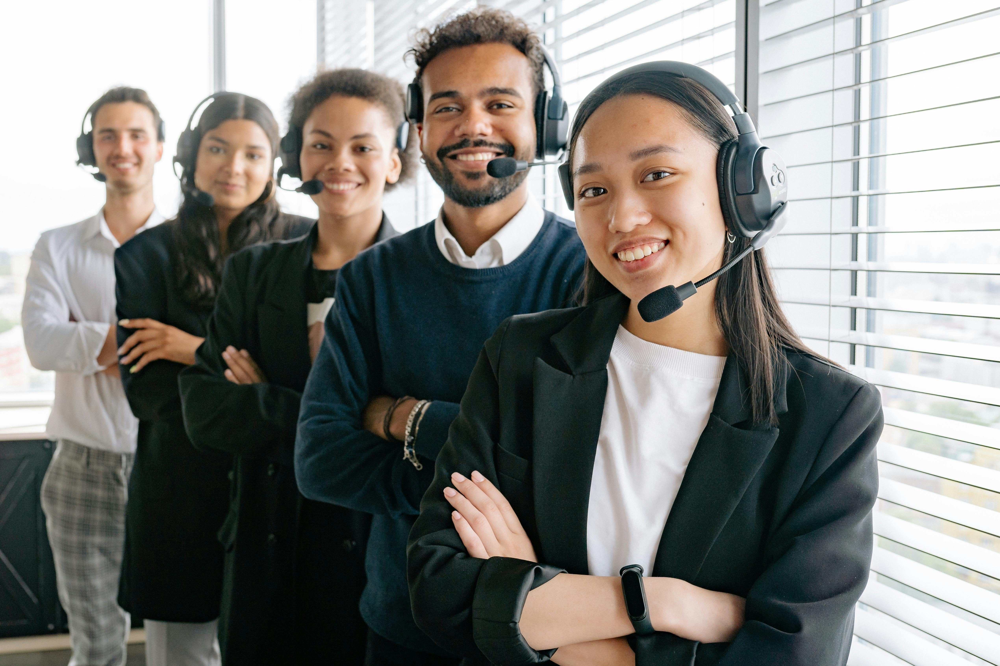

**Context** 

Jenis produk keuangan yang digunakan oleh masyarakat semakin beragam. Salah satu produk keuangan yang dikenal luas oleh masyarakat adalah deposito berjangka. Mekanisme deposito berjangka adalah nasabah menyetorkan sejumlah uang ke bank atau lembaga keuangan, dan uang tersebut hanya dapat ditarik setelah jangka waktu tertentu. Sebagai kompensasi, nasabah akan diberikan bunga tetap sesuai dengan nominal uang yang disetorkan.

Namun demikian, sebagai entitas bisnis dengan produk keuangan dan pelanggan masing-masing, bank tetap harus bersaing agar tidak kehilangan pelanggan. Salah satu cara untuk mendapatkan nasabah baru adalah dengan mengadakan kampanye pemasaran.

**Problem Statement**

**Divisi business development** pada **Bank ABC** ingin meningkatkan performa kampanye pemasaran untuk kedepannya. Kampanye pemasaran yang dilakukan berupa memberikan penawaran promosi, edukasi produk, menghubungi calon pelanggan, dan meningkatkan hubungungan (*engagement*) dengan calon pelanggan.

Saat ini divisi pemasaran menargetkan audiens pemasaran berbasis *rule-based* dengan menentukan kriteria jelas dan spesifik untuk mengidentifikasi calon pelanggan yang potensial. Saat ini, Bank ABC menerapkan sistem rule based dengan nilai dari rata rata proporsi tiap fitur terhadap deposit

Divisi pemasaran ingin untuk mencari alternatif kriteria calon pelanggan potensial yang lebih sesuai. Hal ini diharapkan dapat meningkatkan profitabiltas perusahaan dengan memberikan kampanye pemasaran pada calon pelanggan yang tepat.

**Goals**

Bank ABC menyediakan dataset hasil kampanye pemasaran yang pernah dilakukan. Dataset tersebut digunakan untuk **memprediksi jenis audiens yang memiliki peluang tertinggi untuk melakukan deposit pada Bank ABC.** 

Fitur data yang tersedia pada dataset berupa usia, jenis pekerjaan, saldo, kepemilikan rumah, kepemilikan utang, tipe media komunikasi, bulan kontak terakhir, jumlah kontak yang dilakukan, lama hari setelah terakhir kali calon pelanggan di kontak, dan hasil dari kampanye yang telah dilakukan.

Fitur tersebut dapat digunakan oleh Bank ABC untuk mengembangkan model *machine learning* yang lebih akurat dibandingkan *rule-based*. 

**Analytic Approach**

Sebagai data scientist pada Bank ABC, saya akan melakukan *data preparation* dan menentukan model klasifikasi yang tepat untuk memprediksi. Model klasifikasi yang akan diuji adalah random forest classifier, decition tree classifier, logistic regression, dan gradient boost classifier.

**Metric Evaluation**

Evaluasi metrik yang akan digunakan adalah **F1-score**, yaitu ukuran kinerja model klasifikasi yang menggabungkan dua aspek utama:
1. Ketepatan model dalam memprediksi orang yang melakukan deposit yang sebenarnya melakukan deposit (Precision).
2. Kemampuan model dalam mengidentifikasi banyak dari customer yang benar benar melakukan deposit (Recall).





# <span style="color:RoyalBlue"> 2. Data Understanding</span>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
#open data
df = pd.read_csv("data_bank_marketing_campaign.csv")
display(df.head(),df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7813 entries, 0 to 7812
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   age       7813 non-null   int64 
 1   job       7813 non-null   object
 2   balance   7813 non-null   int64 
 3   housing   7813 non-null   object
 4   loan      7813 non-null   object
 5   contact   7813 non-null   object
 6   month     7813 non-null   object
 7   campaign  7813 non-null   int64 
 8   pdays     7813 non-null   int64 
 9   poutcome  7813 non-null   object
 10  deposit   7813 non-null   object
dtypes: int64(4), object(7)
memory usage: 671.6+ KB


,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,yes
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,yes
2,51,admin.,3025,no,no,cellular,may,1,352,other,yes
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,no
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,no


None

Dataset yang disediakan berisi 7813 data. 
Kita akan membagi data tersebut menjadi 2 data
1. 80% data akan menjadi data train untuk melatih model
2. 20% data akan menjadi data test untuk mengevaluasi model


Berikut adalah kolom yang tersedia pada dataset:


| **Kategori Kolom**       | **Kolom**  | **Deskripsi**                                           |
|--------------------------|------------|---------------------------------------------------------|
| **Profil Pelanggan**     | age       | Usia dari klien                                         |
|                          | job  | Jenis pekerjaan dari klien                              |
|                          | balance      | Saldo rekening                                          |
|                          | housing  | Apakah klien memiliki pinjaman perumahan                |
|                          | loan   | Apakah klien memiliki pinjaman pribadi                  |
| **Data Pemasaran**       | contact     | Jenis komunikasi kontak                                 |
|                          | month      | Bulan kontak terakhir dalam tahun                       |
|                          | campaign   | Jumlah kontak yang dilakukan selama kampanye ini untuk klien |
|                          | pdays      | Jumlah hari setelah klien dihubungi dari kampanye sebelumnya |
|                          | poutcome | Hasil dari kampanye pemasaran sebelumnya             |
|                          | deposit    | Apakah pelanggan melakukan deposito atau tidak          |

Catatan:
1. Fitur balance dapat bernilai negatif dikarenakan adanya biaya admin yang dapat mengurangi saldo rekening nasabah hingga negatif jika saldo nasabah saat itu adalah kosong (0).
2. Fitur pdays dapat bernilai -1 mengartikan calon pelanggan tersebut belum pernah dihubungi pada campaign sebelumnya.
3. Fitur poutcome memiliki 4 nilai yaitu:
- Success: kampanye yang dilakukan sebelumnya berhasil membuat calon pelanggan menggunakan produk meskipun sudah dihubungi
- Failure: kampanye yang dilakukan sebelumnya tidak membuat calon pelanggan menggunakan produk meskipun sudah dihubungi
- Other: calon pelanggan tidak mengangkat ketika dihubungi
- Unknown: calon pelanggan tidak pernah dihubungi sebelumnya

Kita akan gunakan kolom deposit sebagai label yang akan diprediksi, sedangkan kolom lainnya akan dijadikan sebagai fitur untuk memprediksi label.

In [3]:
#encode deposit to numeric
df["deposit"] = np.where(df["deposit"]=="no",0,1)

In [4]:
#memisahkan X dan y untuk dilakukan train_test_split
X = df.drop("deposit",axis=1)
y = df["deposit"]

Kemudian kita akan mengasumsikan 20% data dari dataset akan menjadi data `test` yang berfungsi untuk mengevaluasi performa model, sedangkan 80% dari dataset akan menjadi data `train` yang berfungsi untuk melatih model.

In [5]:
#Memisahkan data train dan test
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=2020)
display(X_train.shape,X_test.shape)

(6250, 10)

(1563, 10)

In [6]:
#menggabungkan X_train dan y_train
train = X_train.join(y_train).sort_index()
train

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1
2,51,admin.,3025,no,no,cellular,may,1,352,other,1
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...
7807,33,management,0,yes,yes,cellular,may,2,-1,unknown,0
7809,48,housemaid,5473,no,no,cellular,feb,2,184,success,1
7810,36,unknown,179,no,no,cellular,aug,8,-1,unknown,0
7811,31,admin.,54,yes,no,cellular,nov,1,-1,unknown,0


In [7]:
#menggabungkan X_test dan y_test
test = X_test.join(y_test).sort_index()
test

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
11,33,housemaid,1107,yes,no,cellular,mar,1,-1,unknown,1
14,30,management,4808,no,no,cellular,mar,1,-1,unknown,1
17,30,services,0,no,no,cellular,jan,1,-1,unknown,0
20,48,services,2597,yes,no,cellular,may,2,355,failure,0
43,57,technician,950,yes,no,cellular,jul,1,-1,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...
7789,55,admin.,602,no,no,cellular,jun,3,90,success,1
7797,26,blue-collar,78,no,no,telephone,jan,1,-1,unknown,0
7800,72,retired,1129,no,no,cellular,aug,1,-1,unknown,1
7804,52,admin.,423,yes,yes,cellular,oct,2,96,failure,0


Untuk tahap berikutnya, kita akan melakukan data cleaning pada data train dan test secara terpisah untuk mencegah `data leakage`

# <span style="color:RoyalBlue">3. Data Preparation</span>

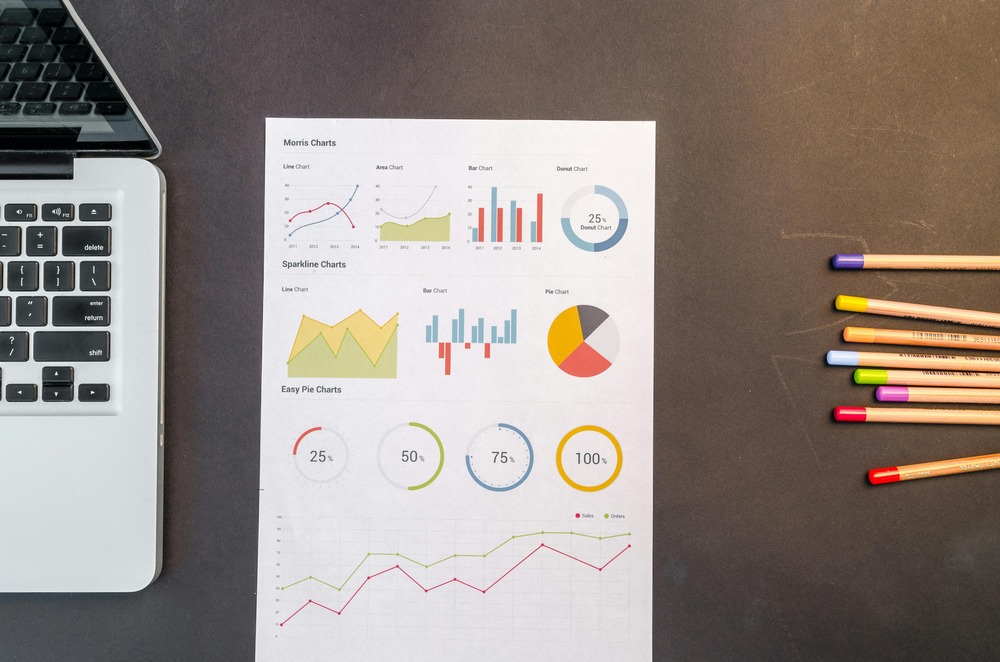

Pada bagian ini, adalah bagian tahap persiapan data train dan test sebelum digunakan untuk melatih dan menguji model. Langkah - langkah data prepration yang dilalui adalah:

[**Handling Missing Value**](#Handling-Missing-Value)

[**Handling Data Duplicates pada Data Train**](#Handling-Data-Duplicates-pada-Data-Train)

[**Data Range Constrains**](#Data-Range-Constrains)

[**Handling Outlier**](#Handling-Outlier)

[**Normality Test**](#Normality-Test)

[**Feature Engineering**](#Feature-Engineering)

[**Handling Categorical Data**](#Handling-Categorical-Data)

### Handling Missing Value

In [8]:
#Memeriksa jumlah NaN Values
display(train.isna().sum())
display(test.isna().sum())

age         0
job         0
balance     0
housing     0
loan        0
contact     0
month       0
campaign    0
pdays       0
poutcome    0
deposit     0
dtype: int64

age         0
job         0
balance     0
housing     0
loan        0
contact     0
month       0
campaign    0
pdays       0
poutcome    0
deposit     0
dtype: int64

Tidak ada missing values pada dataset test dan train

### Handling Data Duplicates pada Data Train

In [9]:
#Memeriksa jumlah data duplikat pada data Train
display(train.duplicated().sum())

6

In [10]:
#Menghapus data duplikat pada data Train
train = train.drop_duplicates()

display(train.shape)

(6244, 11)

Terdapat data duplikat pada data train. Maka saya akan menghapus baris data yang mengandung data duplikat tersebut.

### Data Range Constrains

In [11]:
#Melihat value pada pdays berdasarkan poutome pada data train
display(train.groupby("poutcome")[["pdays"]].value_counts())

poutcome  pdays
failure    181       12
           182       12
           342       12
           91        11
           92        11
                   ... 
success    651        1
           771        1
unknown   -1       4658
           98         1
           188        1
Name: count, Length: 662, dtype: int64

In [12]:
#Melihat value pada pdays berdasarkan poutome pada data test
display(test.groupby("poutcome")[["pdays"]].value_counts())

poutcome  pdays
failure    183        4
           350        4
           92         3
           99         3
           133        3
                   ... 
success    399        1
           405        1
           407        1
           541        1
unknown   -1       1153
Name: count, Length: 277, dtype: int64

In [13]:
#Melihat unique values pada data train untuk kolom poutome
display(train["poutcome"].value_counts())
train[train["poutcome"]=="other"].sort_values("pdays")

poutcome
unknown    4660
failure     689
success     593
other       302
Name: count, dtype: int64

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
1605,28,blue-collar,1285,no,no,telephone,jan,2,2,other,0
5787,31,management,1384,yes,no,cellular,jan,2,2,other,0
5753,31,unemployed,315,no,no,cellular,jan,1,2,other,0
810,35,technician,633,yes,yes,cellular,feb,3,5,other,0
3151,26,blue-collar,184,no,no,cellular,feb,2,6,other,0
...,...,...,...,...,...,...,...,...,...,...,...
6669,44,management,1090,no,no,cellular,jul,4,532,other,1
1937,56,management,12356,yes,no,cellular,may,1,551,other,1
3541,39,unemployed,265,yes,no,unknown,may,1,555,other,1
1324,27,blue-collar,821,yes,yes,unknown,sep,1,778,other,0


Seharusnya jika fitur `poutcome` bernilai `unknown` mengartikan pelanggan tidak pernah dihubungi pada kampanye sebelumnya yang ditandai dengan nilai -1 pada fitur `pdays`. Namun, ditemukan pada data train jika terdapat data dengan `pdays` positif namun `unknown` pada fitur `poutcome`. 

Hal ini mungkin terjadi karena kesalahan sistem pencatatan. Maka saya akan mengganti nilai pada kondisi tersebut dengan nilai `other` mengartikan kita sudah menghubungi pelanggan namun tidak merespon.

In [14]:
#Mengubah nilai poutcomes yang bermasalah pada data train
print("before")
display(train.groupby("poutcome")[["pdays"]].value_counts())

train["poutcome"] = np.where((train["pdays"]>0) & (train["poutcome"]=="unknown"),"other",train["poutcome"])

print("after")
display(train.groupby("poutcome")[["pdays"]].value_counts())

before


poutcome  pdays
failure    181       12
           182       12
           342       12
           91        11
           92        11
                   ... 
success    651        1
           771        1
unknown   -1       4658
           98         1
           188        1
Name: count, Length: 662, dtype: int64

after


C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\3769616868.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train["poutcome"] = np.where((train["pdays"]>0) & (train["poutcome"]=="unknown"),"other",train["poutcome"])


poutcome  pdays
failure    181       12
           182       12
           342       12
           91        11
           92        11
                   ... 
success    469        1
           472        1
           651        1
           771        1
unknown   -1       4658
Name: count, Length: 660, dtype: int64

In [15]:
#Mengubah nilai poutcomes yang bermasalah pada data test
print("before")
display(test.groupby("poutcome")[["pdays"]].value_counts())

test["poutcome"] = np.where((test["pdays"]>0) & (test["poutcome"]=="unknown"),"other",test["poutcome"])

print("after")
display(test.groupby("poutcome")[["pdays"]].value_counts())

before


poutcome  pdays
failure    183        4
           350        4
           92         3
           99         3
           133        3
                   ... 
success    399        1
           405        1
           407        1
           541        1
unknown   -1       1153
Name: count, Length: 277, dtype: int64

after


poutcome  pdays
failure    183        4
           350        4
           92         3
           99         3
           133        3
                   ... 
success    399        1
           405        1
           407        1
           541        1
unknown   -1       1153
Name: count, Length: 277, dtype: int64

### Handling Outlier

Pada bagian ini kita akan menganalisa apakah ada data outlier pada data train yang dapat berpotensi mengurangi performa model

In [16]:
#Melihat summary descriptive data train dan test
display(train.describe())

display(test.describe())

,age,balance,campaign,pdays,deposit
count,6244.000000,6244.000000,6244.000000,6244.000000,6244.000000
mean,41.193786,1519.292761,2.531550,51.721813,0.477899
std,11.912285,3132.582096,2.710401,108.846176,0.499551
min,18.000000,-3058.000000,1.000000,-1.000000,0.000000
25%,32.000000,133.000000,1.000000,-1.000000,0.000000
50%,39.000000,548.500000,2.000000,-1.000000,0.000000
75%,49.000000,1679.750000,3.000000,34.250000,1.000000
max,95.000000,66653.000000,63.000000,854.000000,1.000000


,age,balance,campaign,pdays,deposit
count,1563.000000,1563.000000,1563.000000,1563.000000,1563.000000
mean,41.507997,1490.912988,2.474728,50.358285,0.477927
std,11.961383,2915.567071,2.797446,105.116396,0.499672
min,19.000000,-6847.000000,1.000000,-1.000000,0.000000
25%,32.000000,106.000000,1.000000,-1.000000,0.000000
50%,39.000000,553.000000,2.000000,-1.000000,0.000000
75%,49.000000,1696.500000,3.000000,56.000000,1.000000
max,93.000000,45248.000000,43.000000,782.000000,1.000000


Terlihat persebaran data yang cukup besar pada fitur usia, balance, campaign dan pdays. mari kita lihat dari sudut pandang boxplot

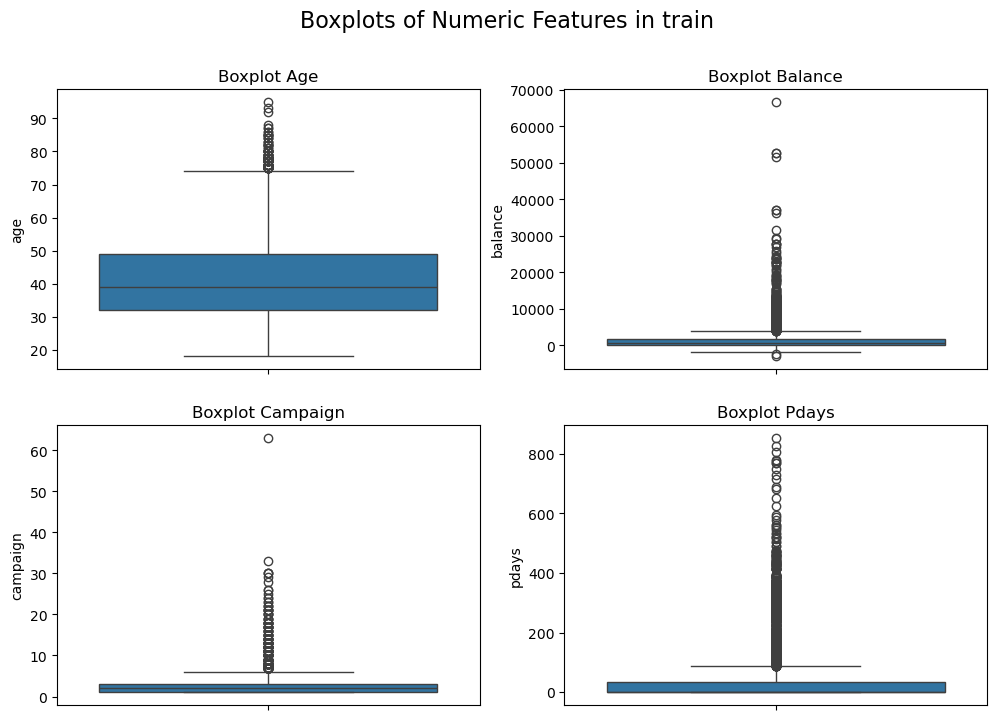

In [17]:
#Boxplot data numeric pada train data
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
sns.boxplot(train["age"])
plt.title("Boxplot Age")

plt.subplot(2,2,2)
sns.boxplot(train["balance"])
plt.title("Boxplot Balance")

plt.subplot(2,2,3)
sns.boxplot(train["campaign"])
plt.title("Boxplot Campaign")

plt.subplot(2,2,4)
sns.boxplot(train["pdays"])
plt.title("Boxplot Pdays")

plt.suptitle("Boxplots of Numeric Features in train", fontsize=16)

plt.show()

Pada train data,  terdapat extreme outlier pada data campaign dan balance

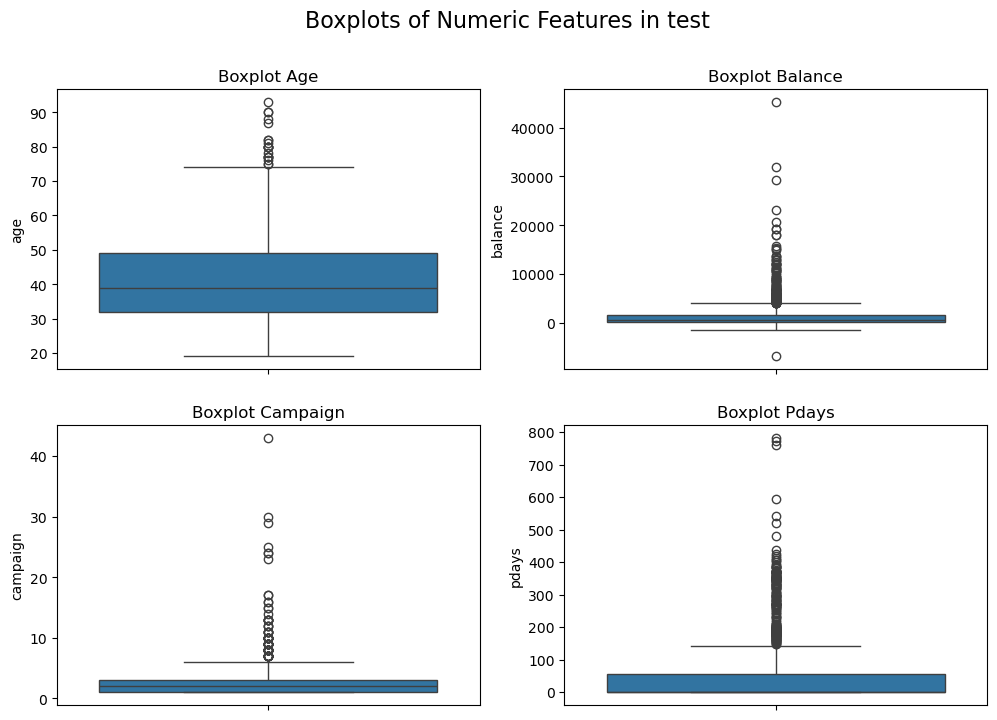

In [18]:
#Boxplot data numeric pada test data
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
sns.boxplot(test["age"])
plt.title("Boxplot Age")

plt.subplot(2,2,2)
sns.boxplot(test["balance"])
plt.title("Boxplot Balance")

plt.subplot(2,2,3)
sns.boxplot(test["campaign"])
plt.title("Boxplot Campaign")

plt.subplot(2,2,4)
sns.boxplot(test["pdays"])
plt.title("Boxplot Pdays")

plt.suptitle("Boxplots of Numeric Features in test", fontsize=16)

plt.show()

Pada test data, ditemukan juga extreme outlier pada data campaign dan balance

Sekarang kita akan menganalisa data menggunakan IQR

In [19]:
#memeriksa outlier dengan menghitung IQR pada data train (dengan IQR 1.5)
columns = ["age","balance","campaign","pdays"]
list_Q1 = []
list_Q3 = []
iqr_list= []
list_l_bound = []
list_u_bound = []
length_list = []
percentage_n_list =[]

for col in columns:
    Q3 = train[col].quantile(0.75)
    Q1 = train[col].quantile(0.25)
    IQR = Q3 - Q1
    u_bound = Q3 + 1.5*IQR # IQR 1.5x
    l_bound = Q1 - 1.5*IQR # IQR 1.5x
    length = len(train[(train[col] < l_bound) | (train[col] > u_bound) ])
    percentage_n = round(length/len(train),2)
    list_Q1.append(Q1)
    list_Q3.append(Q3)
    iqr_list.append(IQR)
    list_l_bound.append(l_bound)
    list_u_bound.append(u_bound)
    length_list.append(length)
    percentage_n_list.append(percentage_n)
train_iqr = pd.DataFrame({
    "columns":columns,
    "Q1":list_Q1,
    "Q3":list_Q3,
    "IQR":iqr_list,
    "Lower Bound":list_l_bound,
    "Upper Bound":list_u_bound,
    "n": length_list,
    "n(%)": percentage_n_list
})

train_iqr

,columns,Q1,Q3,IQR,Lower Bound,Upper Bound,n,n(%)
0,age,32.0,49.00,17.00,6.500,74.500,100,0.02
1,balance,133.0,1679.75,1546.75,-2187.125,3999.875,589,0.09
2,campaign,1.0,3.00,2.00,-2.000,6.000,341,0.05
3,pdays,-1.0,34.25,35.25,-53.875,87.125,1455,0.23


In [20]:
#memeriksa outlier dengan menghitung IQR pada data train (dengan IQR 3)
columns = ["age","balance","campaign","pdays"]
list_Q1 = []
list_Q3 = []
iqr_list= []
list_l_bound = []
list_u_bound = []
length_list = []
percentage_n_list =[]

for col in columns:
    Q3 = train[col].quantile(0.75)
    Q1 = train[col].quantile(0.25)
    IQR = Q3 - Q1
    u_bound = Q3 + 3*IQR #IQR 3x
    l_bound = Q1 - 3*IQR #IQR 3x
    length = len(train[(train[col] < l_bound) | (train[col] > u_bound) ])
    percentage_n = round(length/len(train),2)
    list_Q1.append(Q1)
    list_Q3.append(Q3)
    iqr_list.append(IQR)
    list_l_bound.append(l_bound)
    list_u_bound.append(u_bound)
    length_list.append(length)
    percentage_n_list.append(percentage_n)
train_iqr = pd.DataFrame({
    "columns":columns,
    "Q1":list_Q1,
    "Q3":list_Q3,
    "IQR":iqr_list,
    "Lower Bound":list_l_bound,
    "Upper Bound":list_u_bound,
    "n": length_list,
    "n(%)": percentage_n_list
})

train_iqr

,columns,Q1,Q3,IQR,Lower Bound,Upper Bound,n,n(%)
0,age,32.0,49.00,17.00,-19.00,100.0,0,0.00
1,balance,133.0,1679.75,1546.75,-4507.25,6320.0,306,0.05
2,campaign,1.0,3.00,2.00,-5.00,9.0,150,0.02
3,pdays,-1.0,34.25,35.25,-106.75,140.0,1048,0.17


Setelah menganalisa jumlah outlier pada fitur numeric menggunakan boxplot maupun perhitungan IQR, ditemukan terdapat banyak data outlier (total record bernilai outlier >30% menggunakan analisa IQR). 

Jika kita bandingan menggunakan boxplot, data test juga memiliki data diatas IQR. Maka agar program mampu untuk melakukan pemodelan yang lebih baik, saya akan menghilangkan data `extreme outlier` saja dengan membandingkan boxplot.

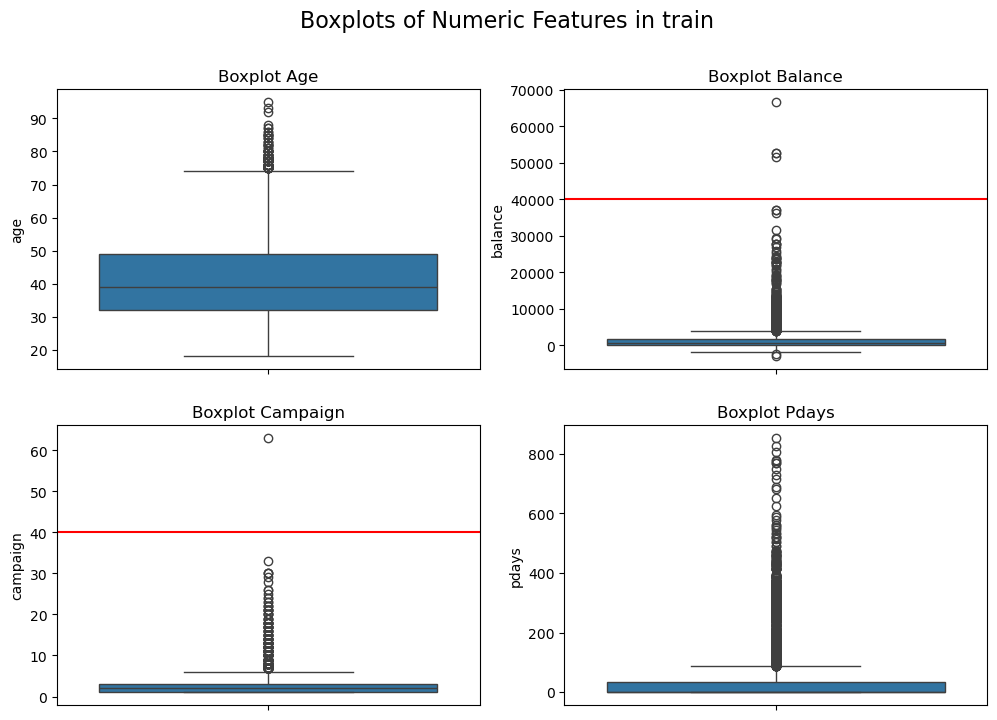

In [21]:
#Menandai data outlier pada train data yang akan dihapus
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
sns.boxplot(train["age"])
plt.title("Boxplot Age")

plt.subplot(2,2,2)
sns.boxplot(train["balance"])
plt.axhline(40000,c='r')
plt.title("Boxplot Balance")

plt.subplot(2,2,3)
sns.boxplot(train["campaign"])
plt.axhline(40,c='r')
plt.title("Boxplot Campaign")

plt.subplot(2,2,4)
sns.boxplot(train["pdays"])
plt.title("Boxplot Pdays")

plt.suptitle("Boxplots of Numeric Features in train", fontsize=16)

plt.show()

In [22]:
#drop all outlier pada data train
train = train[train["campaign"]<40]
train = train[train["balance"]<40000]
    
train

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1
2,51,admin.,3025,no,no,cellular,may,1,352,other,1
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...
7807,33,management,0,yes,yes,cellular,may,2,-1,unknown,0
7809,48,housemaid,5473,no,no,cellular,feb,2,184,success,1
7810,36,unknown,179,no,no,cellular,aug,8,-1,unknown,0
7811,31,admin.,54,yes,no,cellular,nov,1,-1,unknown,0


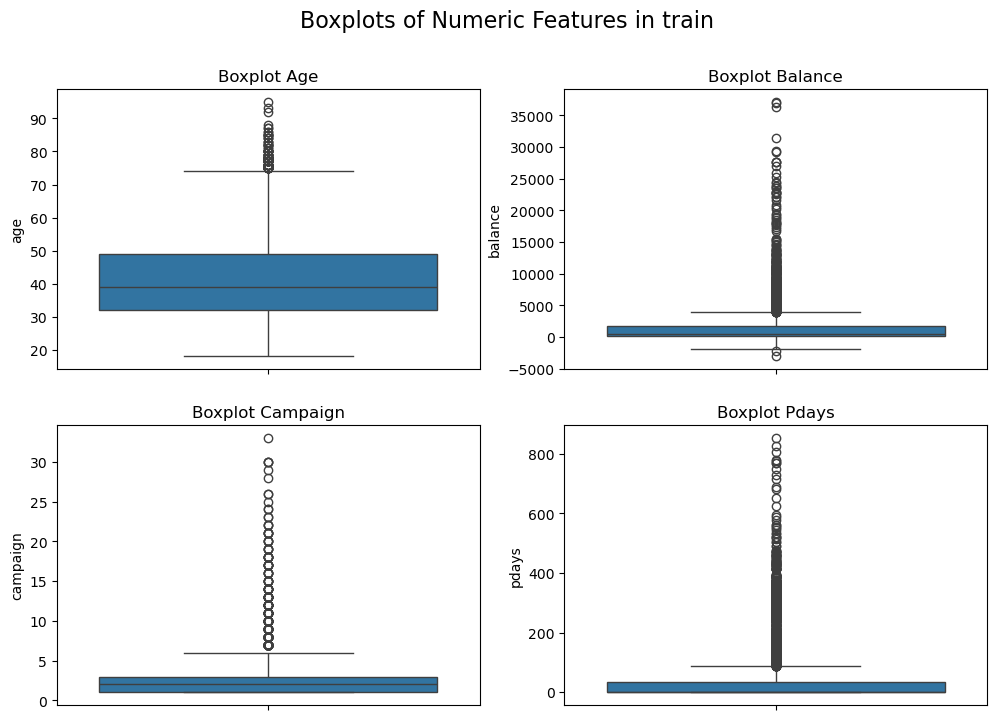

In [23]:
#Hasil setelah menghapus data outlier pada data train
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
sns.boxplot(train["age"])
plt.title("Boxplot Age")

plt.subplot(2,2,2)
sns.boxplot(train["balance"])
plt.title("Boxplot Balance")

plt.subplot(2,2,3)
sns.boxplot(train["campaign"])
plt.title("Boxplot Campaign")

plt.subplot(2,2,4)
sns.boxplot(train["pdays"])
plt.title("Boxplot Pdays")

plt.suptitle("Boxplots of Numeric Features in train", fontsize=16)

plt.show()

In [24]:
#Batasan model pada data train (data numeric)
train.describe()

,age,balance,campaign,pdays,deposit
count,6239.000000,6239.000000,6239.000000,6239.000000,6239.000000
mean,41.182722,1483.274082,2.522199,51.733611,0.477961
std,11.909416,2809.774896,2.600980,108.867730,0.499554
min,18.000000,-3058.000000,1.000000,-1.000000,0.000000
25%,32.000000,132.500000,1.000000,-1.000000,0.000000
50%,39.000000,546.000000,2.000000,-1.000000,0.000000
75%,49.000000,1671.500000,3.000000,34.500000,1.000000
max,95.000000,37127.000000,33.000000,854.000000,1.000000


### Normality Test

Selanjutnya saya akan melihat normalitas pada data numerik menggunakan hisplot dan uji normalitas

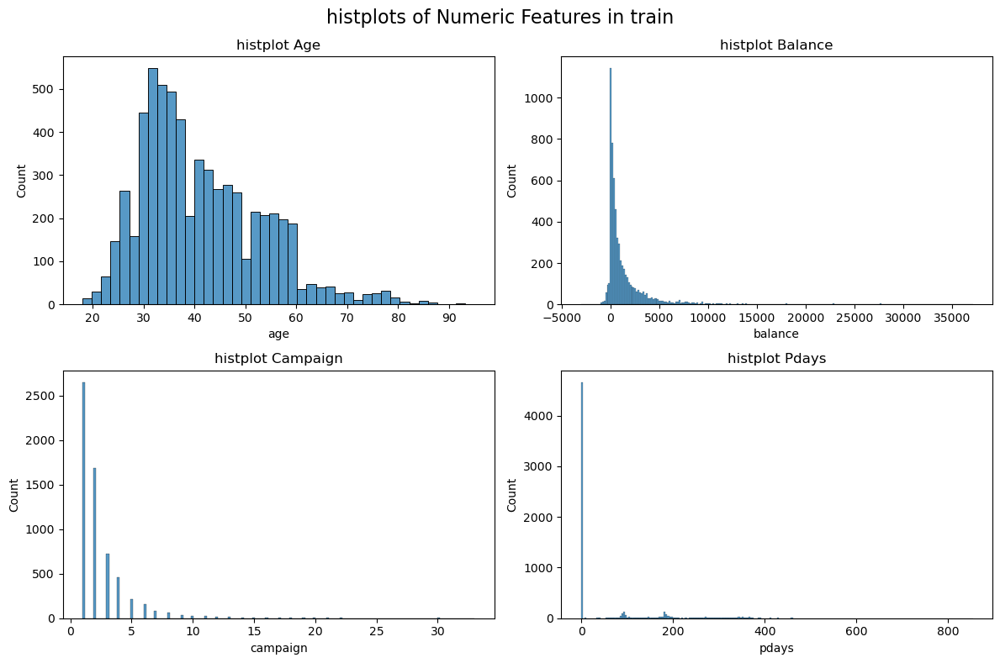

In [25]:
#histplot data numeric pada train data
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
sns.histplot(train["age"])
plt.title("histplot Age")

plt.subplot(2,2,2)
sns.histplot(train["balance"])
plt.title("histplot Balance")

plt.subplot(2,2,3)
sns.histplot(train["campaign"])
plt.title("histplot Campaign")

plt.subplot(2,2,4)
sns.histplot(train["pdays"])
plt.title("histplot Pdays")

plt.suptitle("histplots of Numeric Features in train", fontsize=16)
plt.tight_layout()
plt.show()

In [26]:
from scipy.stats import normaltest

# Apply normaltest to each column and collect the p-values
normality_results = train.select_dtypes(include='number').apply(lambda col: normaltest(col.dropna())[1]).reset_index()

# Rename columns
normality_results.columns = ['Column', 'p-value']

# Print the result
normality_results

,Column,p-value
0,age,1.232584e-141
1,balance,0.000000e+00
2,campaign,0.000000e+00
3,pdays,0.000000e+00
4,deposit,0.000000e+00


In [27]:
normality_results[normality_results['p-value']<=0.05]['Column'].unique()

array(['age', 'balance', 'campaign', 'pdays', 'deposit'], dtype=object)

Terlihat semua data numerik tidak terdistribusi normal, maka pada model pipeline semua fitur akan dilakukan scaling robust agar model lebih konsisten pada data dengan nilai outlier.

### Feature Engineering

#### Bin Age

Kemudian untuk memperkaya model, saya akan mencoba untuk menambahkan fitur baru yaitu bin_age yang merupakan pengelompokan umur calon pelanggan menjadi 4 kelompok yaitu:

| Kelompok Umur | Alasan                                                                                  |
|---------------|-----------------------------------------------------------------------------------------|
| < 25 tahun    | Umumnya memiliki pendapatan yang masih terbatas dan lebih fokus pada investasi jangka panjang atau kebutuhan konsumtif.                                    |
| 25 - 40 tahun | Biasanya sedang membangun karir dan keluarga, sehingga lebih mungkin memiliki tabungan yang cukup untuk melakukan deposito sebagai investasi jangka panjang. |
| 41 - 60 tahun | Umumnya memiliki pendapatan dan tabungan yang stabil, serta memiliki tujuan keuangan jangka panjang seperti pensiun atau pendidikan anak.               |
| > 60 tahun    | Biasanya memiliki tabungan yang cukup besar dan lebih mengutamakan investasi yang aman dan stabil untuk masa pensiun.                                    |


In [28]:
train['bin_age']=pd.cut(train['age'],bins=[0, 25, 40, 60, float('inf')],labels=["<25 tahun","25 - 40 tahun", "41 - 60 tahun",">60 tahun"])
display(train.head(),test.head())

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1,41 - 60 tahun
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1,25 - 40 tahun
2,51,admin.,3025,no,no,cellular,may,1,352,other,1,41 - 60 tahun
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0,25 - 40 tahun
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0,25 - 40 tahun


,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit
11,33,housemaid,1107,yes,no,cellular,mar,1,-1,unknown,1
14,30,management,4808,no,no,cellular,mar,1,-1,unknown,1
17,30,services,0,no,no,cellular,jan,1,-1,unknown,0
20,48,services,2597,yes,no,cellular,may,2,355,failure,0
43,57,technician,950,yes,no,cellular,jul,1,-1,unknown,0


In [29]:
bin_age=list(train["bin_age"].unique().categories)
bin_age

['<25 tahun', '25 - 40 tahun', '41 - 60 tahun', '>60 tahun']

In [30]:
test['bin_age'] = pd.cut(test['age'], bins=[0, 25, 40, 60, float('inf')],labels=["<25 tahun","25 - 40 tahun", "41 - 60 tahun",">60 tahun"])

In [31]:
display(train["bin_age"].value_counts())
display(test["bin_age"].value_counts())

bin_age
25 - 40 tahun    3237
41 - 60 tahun    2398
>60 tahun         348
<25 tahun         256
Name: count, dtype: int64

bin_age
25 - 40 tahun    802
41 - 60 tahun    620
>60 tahun         90
<25 tahun         51
Name: count, dtype: int64

#### Bin_Balance

Saya juga akan mencoba untuk membuat fitur baru yaitu bin_balance dengan mengelompokan saldo calon pelanggan menjadi 5 kelompok yang sama rata berdasarkan nilai quartil.

In [32]:
bin_bal=list(pd.qcut(train['balance'],5).unique().categories)

# Mengubah batas bawah dari interval pertama menjadi -float('inf')
bin_bal[0] = pd.Interval(left=-float('inf'), right=bin_bal[0].right, closed='right')

# Mengubah batas atas dari interval terakhir menjadi float('inf')
bin_bal[-1] = pd.Interval(left=bin_bal[-1].left, right=float('inf'), closed='right')
bin_bal 

[Interval(-inf, 71.0, closed='right'),
 Interval(71.0, 341.0, closed='right'),
 Interval(341.0, 849.8, closed='right'),
 Interval(849.8, 2161.0, closed='right'),
 Interval(2161.0, inf, closed='right')]

In [33]:
label = ['A', 'B', 'C', 'D', 'E']
train['bin_balance'] = pd.cut(train['balance'], bins=bin_bal, labels=label)
test['bin_balance'] = pd.cut(test['balance'], bins=bin_bal, labels=label)
display(train,test)

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1,41 - 60 tahun,"(849.8, 2161.0]"
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1,25 - 40 tahun,"(-inf, 71.0]"
2,51,admin.,3025,no,no,cellular,may,1,352,other,1,41 - 60 tahun,"(2161.0, inf]"
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0,25 - 40 tahun,"(-inf, 71.0]"
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0,25 - 40 tahun,"(71.0, 341.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7807,33,management,0,yes,yes,cellular,may,2,-1,unknown,0,25 - 40 tahun,"(-inf, 71.0]"
7809,48,housemaid,5473,no,no,cellular,feb,2,184,success,1,41 - 60 tahun,"(2161.0, inf]"
7810,36,unknown,179,no,no,cellular,aug,8,-1,unknown,0,25 - 40 tahun,"(71.0, 341.0]"
7811,31,admin.,54,yes,no,cellular,nov,1,-1,unknown,0,25 - 40 tahun,"(-inf, 71.0]"


,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance
11,33,housemaid,1107,yes,no,cellular,mar,1,-1,unknown,1,25 - 40 tahun,"(849.8, 2161.0]"
14,30,management,4808,no,no,cellular,mar,1,-1,unknown,1,25 - 40 tahun,"(2161.0, inf]"
17,30,services,0,no,no,cellular,jan,1,-1,unknown,0,25 - 40 tahun,"(-inf, 71.0]"
20,48,services,2597,yes,no,cellular,may,2,355,failure,0,41 - 60 tahun,"(2161.0, inf]"
43,57,technician,950,yes,no,cellular,jul,1,-1,unknown,0,41 - 60 tahun,"(849.8, 2161.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7789,55,admin.,602,no,no,cellular,jun,3,90,success,1,41 - 60 tahun,"(341.0, 849.8]"
7797,26,blue-collar,78,no,no,telephone,jan,1,-1,unknown,0,25 - 40 tahun,"(71.0, 341.0]"
7800,72,retired,1129,no,no,cellular,aug,1,-1,unknown,1,>60 tahun,"(849.8, 2161.0]"
7804,52,admin.,423,yes,yes,cellular,oct,2,96,failure,0,41 - 60 tahun,"(341.0, 849.8]"


In [34]:
train['bin_balance'] = train['bin_balance'].cat.rename_categories({
    pd.Interval(-np.inf, 71.0, closed='right'): '1',
    pd.Interval(71.0, 341.0, closed='right'): '2',
    pd.Interval(341.0, 849.8, closed='right'): '3',
    pd.Interval(849.8, 2161.0, closed='right'): '4',
    pd.Interval(2161.0, np.inf, closed='right'): '5'
})


test['bin_balance'] = test['bin_balance'].cat.rename_categories({
    pd.Interval(-np.inf, 71.0, closed='right'): '1',
    pd.Interval(71.0, 341.0, closed='right'): '2',
    pd.Interval(341.0, 849.8, closed='right'): '3',
    pd.Interval(849.8, 2161.0, closed='right'): '4',
    pd.Interval(2161.0, np.inf, closed='right'): '5'
})
train.head()

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1,41 - 60 tahun,4
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1,25 - 40 tahun,1
2,51,admin.,3025,no,no,cellular,may,1,352,other,1,41 - 60 tahun,5
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0,25 - 40 tahun,1
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0,25 - 40 tahun,2


In [35]:
display(train["bin_balance"].value_counts())
display(test["bin_balance"].value_counts())

bin_balance
1    1257
4    1250
5    1246
2    1244
3    1242
Name: count, dtype: int64

bin_balance
1    342
4    319
5    314
2    298
3    290
Name: count, dtype: int64

#### Bin_pdays

Saya juga akan mencoba untuk membuat fitur baru yaitu bin_pdays dengan mengelompokan lama hari sejak terakhir kali calon pelanggan dihubungi oleh tim Bank ABC menjadi 5 kelompok yang sama rata berdasarkan nilai quartil.

In [36]:
bin_pdays=list(pd.qcut(train['pdays'],10,duplicates='drop').unique().categories)

# Mengubah batas atas dari interval terakhir menjadi float('inf')
bin_pdays[-1] = pd.Interval(left=bin_pdays[-1].left, right=float('inf'), closed='right')
bin_pdays

[Interval(-1.001, 95.0, closed='right'),
 Interval(95.0, 193.0, closed='right'),
 Interval(193.0, inf, closed='right')]

In [37]:
train['bin_pdays'] = pd.cut(train['pdays'], bins=bin_pdays)
test['bin_pdays'] = pd.cut(test['pdays'], bins=bin_pdays)
display(train.sample(5),test.sample(5))

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance,bin_pdays
7294,41,blue-collar,167,no,no,unknown,jun,1,-1,unknown,0,41 - 60 tahun,2,"(-1.001, 95.0]"
7054,44,admin.,262,yes,no,cellular,jul,1,-1,unknown,0,41 - 60 tahun,2,"(-1.001, 95.0]"
5500,47,technician,0,yes,no,cellular,may,1,-1,unknown,0,41 - 60 tahun,1,"(-1.001, 95.0]"
4068,57,retired,720,no,no,telephone,feb,4,-1,unknown,1,41 - 60 tahun,3,"(-1.001, 95.0]"
1499,32,management,141,yes,no,cellular,may,3,89,success,0,25 - 40 tahun,2,"(-1.001, 95.0]"


,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance,bin_pdays
5650,38,entrepreneur,593,yes,yes,cellular,jul,24,-1,unknown,1,25 - 40 tahun,3,"(-1.001, 95.0]"
5006,53,management,232,yes,no,telephone,jan,1,-1,unknown,0,41 - 60 tahun,2,"(-1.001, 95.0]"
224,34,blue-collar,2595,yes,yes,cellular,apr,1,336,other,0,25 - 40 tahun,5,"(193.0, inf]"
4485,43,technician,2643,no,no,telephone,may,5,-1,unknown,1,41 - 60 tahun,5,"(-1.001, 95.0]"
536,32,self-employed,1423,no,no,cellular,aug,4,-1,unknown,1,25 - 40 tahun,4,"(-1.001, 95.0]"


In [38]:
train['bin_pdays'] = train['bin_pdays'].cat.rename_categories({
    pd.Interval(-1.001, 95.0, closed='right'): '1',
    pd.Interval(95.0, 193.0, closed='right'): '2',
    pd.Interval(193.0, np.inf, closed='right'): '3'
})


test['bin_pdays'] = test['bin_pdays'].cat.rename_categories({
    pd.Interval(-1.001, 95.0, closed='right'): '1',
    pd.Interval(95.0, 193.0, closed='right'): '2',
    pd.Interval(193.0, np.inf, closed='right'): '3'
})
train.head()

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance,bin_pdays
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1,41 - 60 tahun,4,1
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1,25 - 40 tahun,1,1
2,51,admin.,3025,no,no,cellular,may,1,352,other,1,41 - 60 tahun,5,3
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0,25 - 40 tahun,1,1
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0,25 - 40 tahun,2,1


### Handling Categorical Data

Selanjuta kita akan menyesuaikan kategorikal data. Yang pertama kita akan melihat jumlah unique values pada categorical data.

In [39]:
#Melihat unique values pada data train
pd.set_option('display.max_colwidth', None)

columns = ['job', 'housing', 'loan', 'contact', 'month','poutcome']
values = []
nunique_list = []
for i in columns:
    value = train[i].unique()
    nunique = train[i].nunique()
    nunique_list.append(nunique)
    values.append(value)

display(
    pd.DataFrame({
    "columns" : columns,
    "values" : values,
    "nunique": nunique_list
})
       )
pd.reset_option('display.max_colwidth')

,columns,values,nunique
0,job,"[admin., self-employed, services, housemaid, technician, management, student, blue-collar, entrepreneur, retired, unemployed, unknown]",12
1,housing,"[no, yes]",2
2,loan,"[no, yes]",2
3,contact,"[cellular, telephone, unknown]",3
4,month,"[jun, apr, may, nov, jan, sep, feb, aug, jul, oct, mar, dec]",12
5,poutcome,"[unknown, other, failure, success]",4


In [40]:
#Melihat unique values pada data train dengan value counts
for i in train.select_dtypes(object).columns:
    display(pd.DataFrame(train[i].value_counts()))

,count
job,
management,1428
technician,1040
blue-collar,1033
admin.,758
services,544
retired,431
self-employed,230
student,200
unemployed,197


,count
housing,
no,3301
yes,2938


,count
loan,
no,5414
yes,825


,count
contact,
cellular,4478
unknown,1324
telephone,437


,count
month,
may,1590
aug,870
jul,832
jun,697
apr,525
nov,520
feb,416
oct,229
jan,183


,count
poutcome,
unknown,4654
failure,689
success,592
other,304


Terdapat nilai unknown pada fitur job dan contact pada data train dan berpotensi ada di data test. Maka dari itu, kita akan melakukan encoding data unknown menjadi np.NaN untuk dapat diimpute menggunakan modus pada pipeline model.

Nilai unknown pada data poutcome tidak diperlakukan missing values karena nilai unknown pada kolom poutcome menjelaskan bahwa calon pelanggan tersebut belum pernah dihubungi sebelumnya.

In [41]:
#Encoding data job dan contact yang unknown menjadi nan untuk nanti akan di impute
train["job"] = np.where(train["job"]=="unknown",np.nan,train["job"])
train["contact"] = np.where(train["contact"]=="unknown",np.nan,train["contact"])


test["job"] = np.where(test["job"]=="unknown",np.nan,test["job"])
test["contact"] = np.where(test["contact"]=="unknown",np.nan,test["contact"])


display(train,test)

,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance,bin_pdays
0,55,admin.,1662,no,no,cellular,jun,2,-1,unknown,1,41 - 60 tahun,4,1
1,39,self-employed,-3058,yes,yes,cellular,apr,3,-1,unknown,1,25 - 40 tahun,1,1
2,51,admin.,3025,no,no,cellular,may,1,352,other,1,41 - 60 tahun,5,3
3,38,services,-87,yes,no,cellular,may,1,-1,unknown,0,25 - 40 tahun,1,1
4,36,housemaid,205,yes,no,telephone,nov,4,-1,unknown,0,25 - 40 tahun,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7807,33,management,0,yes,yes,cellular,may,2,-1,unknown,0,25 - 40 tahun,1,1
7809,48,housemaid,5473,no,no,cellular,feb,2,184,success,1,41 - 60 tahun,5,2
7810,36,NaN,179,no,no,cellular,aug,8,-1,unknown,0,25 - 40 tahun,2,1
7811,31,admin.,54,yes,no,cellular,nov,1,-1,unknown,0,25 - 40 tahun,1,1


,age,job,balance,housing,loan,contact,month,campaign,pdays,poutcome,deposit,bin_age,bin_balance,bin_pdays
11,33,housemaid,1107,yes,no,cellular,mar,1,-1,unknown,1,25 - 40 tahun,4,1
14,30,management,4808,no,no,cellular,mar,1,-1,unknown,1,25 - 40 tahun,5,1
17,30,services,0,no,no,cellular,jan,1,-1,unknown,0,25 - 40 tahun,1,1
20,48,services,2597,yes,no,cellular,may,2,355,failure,0,41 - 60 tahun,5,3
43,57,technician,950,yes,no,cellular,jul,1,-1,unknown,0,41 - 60 tahun,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7789,55,admin.,602,no,no,cellular,jun,3,90,success,1,41 - 60 tahun,3,1
7797,26,blue-collar,78,no,no,telephone,jan,1,-1,unknown,0,25 - 40 tahun,2,1
7800,72,retired,1129,no,no,cellular,aug,1,-1,unknown,1,>60 tahun,4,1
7804,52,admin.,423,yes,yes,cellular,oct,2,96,failure,0,41 - 60 tahun,3,2


In [42]:
#memeriksa jumlah NaN (unknown) values pada tiap kolom
train.isna().sum()/len(train)

age            0.000000
job            0.007533
balance        0.000000
housing        0.000000
loan           0.000000
contact        0.212213
month          0.000000
campaign       0.000000
pdays          0.000000
poutcome       0.000000
deposit        0.000000
bin_age        0.000000
bin_balance    0.000000
bin_pdays      0.000000
dtype: float64

Selain data unknown, terlihat ada kesalahan pengetikan nilai pekerjaan "admin." pada fitur pekerjaan. Maka disini saya akan memperbaiki nilai tersebut menjadi "admin" pada data train dan test

In [43]:
#melakukan penyesuaian nama values 
train["job"] = train["job"].str.replace(".","")
train["job"].unique()

array(['admin', 'self-employed', 'services', 'housemaid', 'technician',
       'management', 'student', 'blue-collar', 'entrepreneur', 'retired',
       'unemployed', nan], dtype=object)

In [44]:
#melakukan penyesuaian nama values 
test["job"] = test["job"].str.replace(".","")
test["job"].unique()

array(['housemaid', 'management', 'services', 'technician', 'retired',
       'blue-collar', 'student', 'admin', 'self-employed', 'unemployed',
       'entrepreneur', nan], dtype=object)

# <span style="color:RoyalBlue"> 4. Modeling & Evaluation</span>

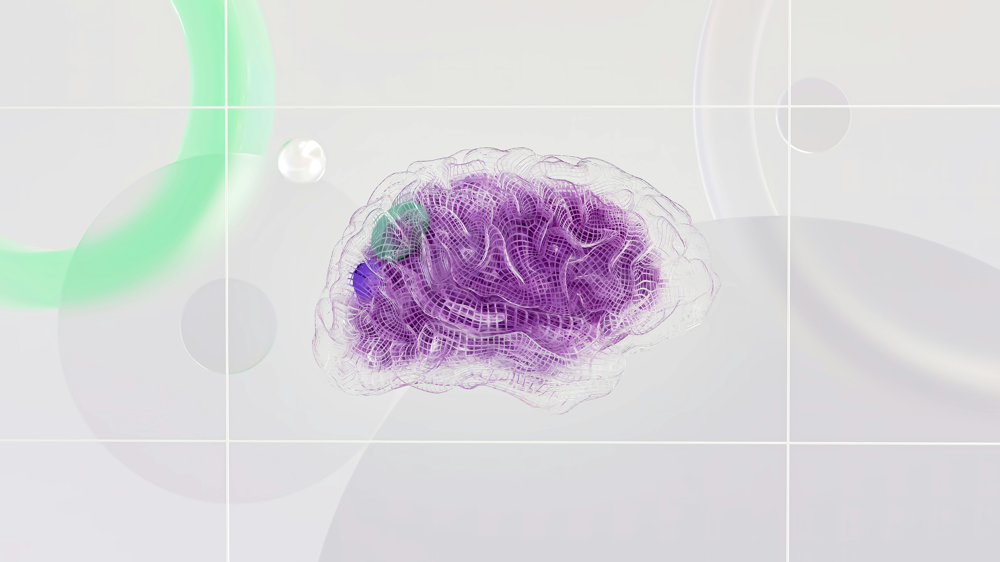

Pada bagian ini, data train akan digunakan untuk melatih model dan menggunakan model tersebut untuk memprediksi label pada data test. Langkah - langkah yang dilalui pada tahapan ini adalah:

[**Modeling (Default)**](#Modeling-(Default))

[**Modeling (Hyperparameter Tuning)**](#Modeling-(Hyperparameter-Tuning))

[**Modeling (Threshold Adjustment**](#Modeling-(Threshold-Adjustment))

[**Feature Evaluation**](#Feature-Evaluation)

[**Rule Based**](#Rule-Based)

[**Business Outcome Evaluation - Rule Based vs Model Based**](#Business-Outcome-Evaluation---Rule-Based-vs-Model-Based)

[**Model Constraints**](#Model-Constraints)

### Modeling (Default)

Pada tahap ini kita akan melakukan modeling tanpa melakukan hyperparameter tuning pada 4 opsi model machine learning yaitu:
- Random forest classifier
- Decision tree classifier
- Logistic regression
- Gradient Boosting Classifier

sebelum melakukan pemodelan, kita akan melakukan data preprocessing dengan tahapan sebagai berikut:
1. Memisahkan data train menjadi X_train dan y_train serta test menjadi X_test dan y_test.
2. data numerik akan diimpute median jika ditemukan data NaN baik pada data X_train dan X_test. Kemudian kedua data tersebut akan melalui tahapan robust scalling.
3. data kategorik nominal selain bulan akan diimpute modus jika ditemukan data NaN baik pada data X_train dan X_test. Kemudian data tersebut akan melalui tahapan encoding menggunakan metode One Hot Encoding dengan parameter drop="first"
4. data kategorik ordinal akan melalui tahapan encoding menggunakan metode Ordinal Encoder.
5. Khusus data kategorik nominal bulan akan melalui tahapan encoding mengguankan metode Label Encoder untuk mengurangi jumlah kolom.

Setelah tahapan preprocessing telah dilalui, data akan melalui tahapan modeling menggunakan 4 model yang telah disebutkan sebelumnya.

Model yang terbaik akan dipilih berdasarkan f1 score dan akan digunakan untuk memprediksi nilai pada data X_test. Hasil prediksi tersebut akan menjadi benchmark nilai model sebelum melakukan hyperparameter tuning pada tahapan berikutnya.

Selain itu, pada data test kita akan memeriksa lebih dalam apakah fitur binning yang telah dibuat sebelumnya lebih efektif dalam membantu model melakukan prediksi atau tidak dengan menganalisa features important.

In [45]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder,FunctionTransformer
import category_encoders as ce #untuk binary encoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler

In [46]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV,StratifiedKFold,train_test_split, cross_val_score
from sklearn.feature_selection import SelectPercentile, SelectKBest,f_regression, f_classif
from sklearn.metrics import RocCurveDisplay
from sklearn.impute import SimpleImputer
import time

In [47]:
train.reset_index(drop=True,inplace=True)
test.reset_index(drop=True,inplace=True)
X_train = train.drop("deposit",axis=1)
y_train = train["deposit"]

X_test = test.drop("deposit",axis=1)
y_test = test["deposit"]

In [48]:
class MonthLabelEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.label_dict = {
            'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
            'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12
        }

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.apply(lambda x: x.map(self.label_dict))

    def get_feature_names_out(self, input_features):
        return input_features
    
categorical_features = ['job', 'housing', 'loan', 'contact', 'poutcome']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

numeric_features = ['balance', 'pdays','campaign','age']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler())])   
    

# Update the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),
        ('ordinal_c1', OrdinalEncoder(categories=[['<25 tahun', '25 - 40 tahun', '41 - 60 tahun', '>60 tahun']]), ["bin_age"]),
        ('ordinal_c2', OrdinalEncoder(categories=[['1','2','3','4','5']]), ["bin_balance"]),
        ('ordinal_c3', OrdinalEncoder(categories=[['1','2','3']]), ["bin_pdays"]),
        ('month_encoder', MonthLabelEncoder(), ['month'])
    ], remainder="passthrough")

In [49]:
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ('classifier', RandomForestClassifier())  # Placeholder untuk classifier
])

param_grid = [
    {
        'classifier': [RandomForestClassifier(random_state=42),
                       DecisionTreeClassifier(random_state=42),
                       LogisticRegression(random_state=42),
                       XGBClassifier(random_state=2020)],
    },
]

# Buat GridSearchCV dengan pipeline
gscv = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring='f1',error_score="raise")

# Measure the fitting time
start_time = time.time()


# Fit GridSearchCV ke data
gscv.fit(X_train, y_train)


end_time = time.time()

fitting_time = end_time - start_time
print(f"Fitting time: {fitting_time:.2f} seconds")

Fitting time: 4.34 seconds


In [50]:
gscv.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['balance', 'pdays',
                                                   'campaign', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=2020, ...))])

In [51]:
pd.DataFrame(gscv.cv_results_).sort_values("rank_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
3,0.218233,0.021681,0.019263,0.005733,"XGBClassifier(base_score=None, booster=None, c...","{'classifier': XGBClassifier(base_score=None, ...",0.665434,0.664898,0.659517,0.644099,0.659051,0.658600,0.007716,1
0,1.044123,0.039503,0.063246,0.019173,RandomForestClassifier(random_state=42),{'classifier': RandomForestClassifier(random_s...,0.643243,0.632689,0.627763,0.625115,0.655113,0.636784,0.011063,2
2,0.126778,0.049167,0.022707,0.005582,LogisticRegression(random_state=42),{'classifier': LogisticRegression(random_state...,0.637708,0.622677,0.623497,0.606403,0.643306,0.626718,0.012926,3
1,0.091474,0.013614,0.021716,0.005223,DecisionTreeClassifier(random_state=42),{'classifier': DecisionTreeClassifier(random_s...,0.602649,0.593333,0.604235,0.586414,0.636290,0.604584,0.017122,4


In [52]:
y_pred=gscv.best_estimator_.predict(X_test)
print('f1_score',f1_score(y_test, y_pred))

f1_score 0.6470588235294118


In [53]:
# Get the best estimator from GridSearchCV
best_estimator = gscv.best_estimator_

# Get the transformer from the best estimator
transformer = best_estimator.named_steps['preprocessor']

# Get the feature names after transformation
feature_names = transformer.get_feature_names_out(input_features=X_train.columns)

# Transform X_train using the transformer
X_train_encoded = transformer.transform(X_train)
X_train_encoded = pd.DataFrame(X_train_encoded, columns=feature_names)
X_train_encoded

,num__balance,num__pdays,num__campaign,num__age,cat__job_admin,cat__job_blue-collar,cat__job_entrepreneur,cat__job_housemaid,cat__job_management,cat__job_retired,...,cat__contact_cellular,cat__contact_telephone,cat__poutcome_failure,cat__poutcome_other,cat__poutcome_success,cat__poutcome_unknown,ordinal_c1__bin_age,ordinal_c2__bin_balance,ordinal_c3__bin_pdays,month_encoder__month
0,0.725146,0.000000,0.0,0.941176,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,2.0,3.0,0.0,6.0
1,-2.341780,0.000000,0.5,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,4.0
2,1.610786,9.943662,-0.5,0.705882,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,2.0,4.0,2.0,5.0
3,-0.411306,0.000000,-0.5,-0.058824,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,5.0
4,-0.221572,0.000000,1.0,-0.176471,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6234,-0.354776,0.000000,0.0,-0.352941,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,5.0
6235,3.201429,5.211268,0.0,0.529412,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,2.0,4.0,1.0,2.0
6236,-0.238467,0.000000,3.0,-0.176471,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,8.0
6237,-0.319688,0.000000,-0.5,-0.470588,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,11.0


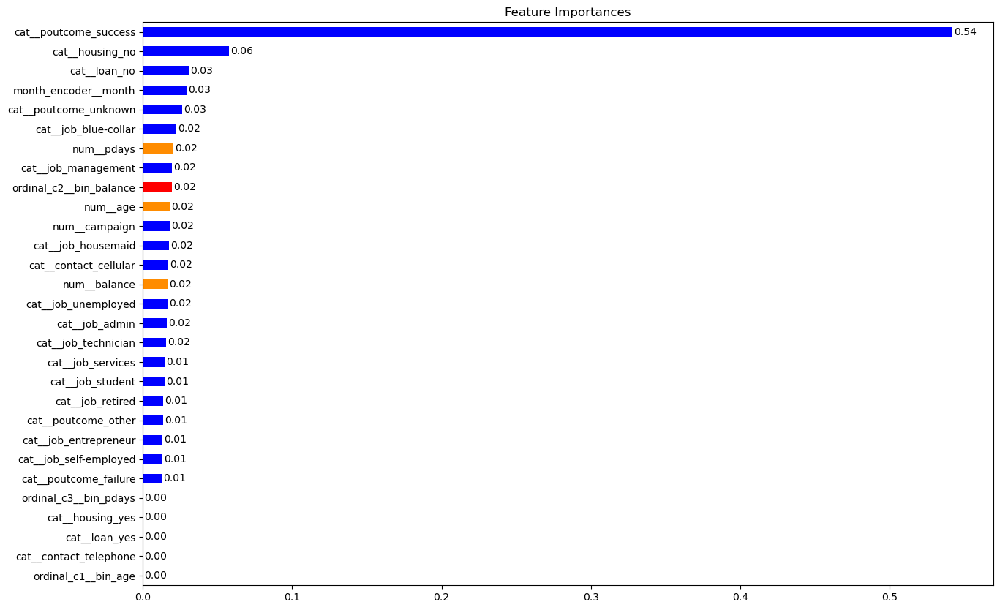

In [54]:
# Get the best estimator from GridSearchCV
best_estimator = gscv.best_estimator_

# Access the final estimator in the pipeline
final_estimator = best_estimator.named_steps['classifier']

# Get the feature importances from the final estimator
feature_importances = final_estimator.feature_importances_

# Get the transformer from the best estimator
transformer = best_estimator.named_steps['preprocessor']

# Get the feature names after transformation
feature_names = transformer.get_feature_names_out(input_features=X_train.columns)

# Create a Series with feature importances and sort it
model_coef = pd.Series(feature_importances, index=X_train_encoded.columns).sort_values()

# Plot the feature importances

colors = ['darkorange' if feature in ['num__age', 'num__pdays', 'num__balance']
          else 'red' if feature in ['ordinal_c1__bin_age', 'ordinal_c3__bin_pdays', 'ordinal_c2__bin_balance']
          else 'blue' for feature in model_coef.index]



plt.figure(figsize=(15, 10))
ax = model_coef.plot(kind='barh', title='Feature Importances',color=colors)


# Add annotations to the plot
for i in ax.patches:
    ax.text(i.get_width() + 0.001,  # position x (at the end of the bar)
            i.get_y() + i.get_height() / 2,  # position y (middle of the bar)
            f'{i.get_width():.2f}',  # text to display (feature importance value)
            ha='left',  # horizontal alignment (left align)
            va='center')  # vertical alignment (center align)
plt.show()

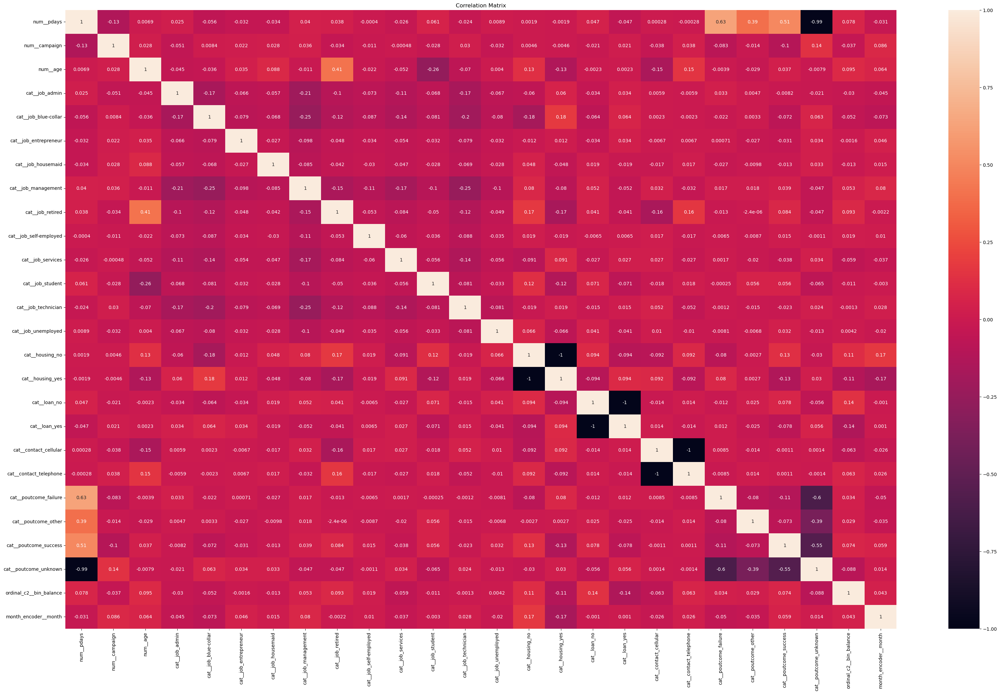

In [108]:
plt.figure(figsize=(40,24))
sns.heatmap(X_train_encoded.corr(method="spearman"),annot=True)
plt.title("Correlation Matrix")
plt.show()

In [56]:
dfcorr=X_train_encoded.select_dtypes(include='number')
corrMatrix=dfcorr.corr(method='spearman')
already_in = set()
result = []
for col in corrMatrix:
    large_corr = corrMatrix[col][corrMatrix[col] >= 0.75 ].index.tolist()
    if large_corr and col not in already_in:
        already_in.update(set(large_corr))
        large_corr.append(col)
        result.append(large_corr)

result

[['num__balance', 'ordinal_c2__bin_balance', 'num__balance'],
 ['num__pdays', 'ordinal_c3__bin_pdays', 'num__pdays'],
 ['num__campaign', 'num__campaign'],
 ['num__age', 'ordinal_c1__bin_age', 'num__age'],
 ['cat__job_admin', 'cat__job_admin'],
 ['cat__job_blue-collar', 'cat__job_blue-collar'],
 ['cat__job_entrepreneur', 'cat__job_entrepreneur'],
 ['cat__job_housemaid', 'cat__job_housemaid'],
 ['cat__job_management', 'cat__job_management'],
 ['cat__job_retired', 'cat__job_retired'],
 ['cat__job_self-employed', 'cat__job_self-employed'],
 ['cat__job_services', 'cat__job_services'],
 ['cat__job_student', 'cat__job_student'],
 ['cat__job_technician', 'cat__job_technician'],
 ['cat__job_unemployed', 'cat__job_unemployed'],
 ['cat__housing_no', 'cat__housing_no'],
 ['cat__housing_yes', 'cat__housing_yes'],
 ['cat__loan_no', 'cat__loan_no'],
 ['cat__loan_yes', 'cat__loan_yes'],
 ['cat__contact_cellular', 'cat__contact_cellular'],
 ['cat__contact_telephone', 'cat__contact_telephone'],
 ['cat__

Secara model default (tanpa hyperparameter tuning) model random forest classifier memiliki performa f1_score tertinggi.

Terdapat korelasi antara fitur:
- ordinal_c1__bin_age dengan num__age
- ordinal_c3__bin_pdays dengan num__pdays
- ordinal_c2__bin_balance dengan num__balance

Terlihat pada grafik features importance, fitur num__pdays, ordinal_c2__bin_balance, dan num__age memiliki nilai feature important lebih tinggi dibandingkan ordinal_c3__bin_pdays, num__balance, dan ordinal_c1__bin_age. 

Maka kita akan kembali menyesuaikan kolom fitur data train dengan fiture importance yang lebih tinggi dan tanpa multicorrelation.

## Modeling (Hyperparameter Tuning)

Pada tahapan ini, kita akan membuang multicorrelation pada train dan test. Kita akan menjalankan kembali ke 4 opsi model sebelumnya. Namun pada tahapan ini kita akan meningkatkan performa model dengan melakukan penyesuaian hyperparameter tuning dan hanya memilih 15 fitur yang paling bisa memprediksi menggunakan Select K Best.

Kita juga akan sekaligus membandingkan kembali model yang tanpa hyperparameter tuning, namun kali ini tidak ada fitur binning dan hanya terpilih 15 fitur saja yang paling bisa memprediksi menggunakan Select K Best.

Setelah kita menemukan model dengan performam f1_Score tertinggi, model kita akan tingkaatkan performanya kembali dengan menyesuaikan threshold toleransi probabilitas memprediksi klasifikasi. 

Pada tahapan akhir pemodelan kita akan mengetahui:
- Jenis model, pemilihan parameter, dan penyesuaian threshold yang terbaik dalam memprediksi data test berdasarkan f1_score
- Fitur apa saja yang paling mempengaruhi model

In [57]:
train.reset_index(drop=True,inplace=True)
test.reset_index(drop=True,inplace=True)
X_train = train.drop(["deposit","bin_age","bin_pdays","balance"],axis=1)
y_train = train["deposit"]

X_test = test.drop(["deposit","bin_age","bin_pdays","balance"],axis=1)
y_test = test["deposit"]

In [58]:
class MonthLabelEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.label_dict = {
            'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
            'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12
        }

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.apply(lambda x: x.map(self.label_dict))

    def get_feature_names_out(self, input_features):
        return input_features
    
categorical_features = ['job', 'housing', 'loan', 'contact', 'poutcome']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])
numeric_features = ['pdays','campaign','age']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler())])   
    

# Update the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),
        ('ordinal_c2', OrdinalEncoder(categories=[['1','2','3','4','5']]), ["bin_balance"]),
        ('month_encoder', MonthLabelEncoder(), ['month'])
    ], remainder="passthrough")

In [59]:
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', RandomForestClassifier())  # Placeholder untuk classifier
])

param_grid = [
        {
        'feature_selection__k': [15],  
        'classifier': [RandomForestClassifier(random_state=2020), #criterion='gini',n_estimators=100,max_depth=None,min_samples_split=2,min_samples_leaf=1
                       DecisionTreeClassifier(random_state=2020), #criterion='gini',max_depth=None,min_samples_split=2,min_samples_leaf=1
                       LogisticRegression(random_state=2020), #solver='lbfsg'
                       XGBClassifier(random_state=2020)], 
    },
        {
        'feature_selection__k': [15],  
        'classifier': [RandomForestClassifier(random_state=2020)],
        'classifier__criterion': ["gini", "entropy", "log_loss"],
        'classifier__n_estimators': [40,50,75,100],
        'classifier__max_depth': [None, 10, 15,20,25,30],
        'classifier__min_samples_split': [2,5,10,15,20],
        'classifier__min_samples_leaf': [1,4,8,10]
    },
    {
        'feature_selection__k': [15],  
        'classifier': [DecisionTreeClassifier(random_state=2020)],
        'classifier__criterion': ["gini", "entropy", "log_loss"],
        'classifier__max_depth': [None, 10,15, 20, 25, 30],
        'classifier__min_samples_split': [2, 5, 10],
        'classifier__min_samples_leaf': [1, 2, 4]
    },
            {
        'feature_selection__k': [15],  
        'classifier': [LogisticRegression(max_iter=1000,random_state=2020)],
        'classifier__solver': ['lbfgs', 'liblinear']
    },
        {
        'feature_selection__k': [15],  
        'classifier': [XGBClassifier(random_state=2020)],
        'classifier__n_estimators': [None,50, 100, 200],
        'classifier__max_depth': [None, 20,30,40],
        'classifier__learning_rate': [None,0.01, 0.1],
    }
    
]

# Buat GridSearchCV dengan pipeline
gscv = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring='f1')

# Measure the fitting time
start_time = time.time()


# Fit GridSearchCV ke data
gscv.fit(X_train, y_train)


end_time = time.time()

fitting_time = end_time - start_time
print(f"Fitting time: {fitting_time:.2f} seconds")

Fitting time: 395.32 seconds


In [60]:
gscv.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['pdays', 'campaign', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'housing', 'loan',
                                                   'contact', 'poutcome']),
                                                 ('ordinal_c2',
                                                  OrdinalEncoder(categories=[['1',
                                                                              '2',
                                                                              '3',
                                                                              '4',
                                                                              '5']]),
                                                  ['bin_balance']),
                                                 ('month_encoder',
                                                  MonthLabelEncoder(),
                                                  ['month'])])),
                ('feature_selection', SelectKBest(k=15)),
                ('classifier', LogisticRegression(random_state=2020))])

In [61]:
pd.DataFrame(gscv.cv_results_).sort_values("rank_test_score").head(15)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier,param_feature_selection__k,param_classifier__criterion,param_classifier__max_depth,param_classifier__min_samples_leaf,param_classifier__min_samples_split,...,param_classifier__learning_rate,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
2,0.072978,0.017214,0.018274,0.003281,LogisticRegression(random_state=2020),15,NaN,NaN,NaN,NaN,...,NaN,{'classifier': LogisticRegression(random_state...,0.644464,0.615101,0.635359,0.611321,0.628217,0.626892,0.012359,1
1076,0.281006,0.051685,0.035446,0.013798,RandomForestClassifier(random_state=2020),15,log_loss,10.0,4.0,15.0,...,NaN,{'classifier': RandomForestClassifier(random_s...,0.629630,0.630292,0.612840,0.625969,0.633120,0.626370,0.007138,2
596,0.197400,0.004801,0.022599,0.001201,RandomForestClassifier(random_state=2020),15,entropy,10.0,4.0,15.0,...,NaN,{'classifier': RandomForestClassifier(random_s...,0.629630,0.630292,0.612840,0.625969,0.633120,0.626370,0.007138,2
1077,0.339143,0.030015,0.035660,0.008983,RandomForestClassifier(random_state=2020),15,log_loss,10.0,4.0,15.0,...,NaN,{'classifier': RandomForestClassifier(random_s...,0.634429,0.629595,0.608358,0.621359,0.637947,0.626338,0.010573,4
597,0.244401,0.006619,0.023998,0.000003,RandomForestClassifier(random_state=2020),15,entropy,10.0,4.0,15.0,...,NaN,{'classifier': RandomForestClassifier(random_s...,0.634429,0.629595,0.608358,0.621359,0.637947,0.626338,0.010573,4
92,0.232906,0.021755,0.025600,0.003072,RandomForestClassifier(random_state=2020),15,gini,10.0,1.0,10.0,...,NaN,{'classifier': RandomForestClassifier(random_s...,0.629665,0.630496,0.610427,0.623301,0.635786,0.625935,0.008709,6
1607,0.072312,0.014163,0.018697,0.006661,"LogisticRegression(max_iter=1000, random_state...",15,NaN,NaN,NaN,NaN,...,NaN,{'classifier': LogisticRegression(max_iter=100...,0.637443,0.615101,0.635945,0.611321,0.628217,0.625605,0.010661,7
1606,0.104578,0.048234,0.021881,0.006573,"LogisticRegression(max_iter=1000, random_state...",15,NaN,NaN,NaN,NaN,...,NaN,{'classifier': LogisticRegression(max_iter=100...,0.637443,0.615101,0.635359,0.611321,0.628217,0.625488,0.010549,8
117,0.254088,0.027582,0.027931,0.003699,RandomForestClassifier(random_state=2020),15,gini,10.0,4.0,15.0,...,NaN,{'classifier': RandomForestClassifier(random_s...,0.632594,0.630394,0.614493,0.617476,0.630811,0.625154,0.007582,9
116,0.236347,0.023446,0.028330,0.005433,RandomForestClassifier(random_state=2020),15,gini,10.0,4.0,15.0,...,NaN,{'classifier': RandomForestClassifier(random_s...,0.629771,0.630394,0.607670,0.623907,0.633028,0.624954,0.009141,10


Model Logistic Regression memiliki F1 Score pada data train yang lebih tinggi yaitu sebesar 0.626892 dengan standard deviation sebesar 0.012359	 sedangkan untuk model random forest classifier adalah 0.626370 dengan standard deviation sebesar 0.00713.

Saya akan memilih model random forest classifier dikarenakan f1_score yang tidak jauh beda dengan logistic regression namun lebih konsisten karena memiliki standard deviation yang lebih rendah.

In [62]:
# Get the mean test scores and corresponding parameters
results = pd.DataFrame(gscv.cv_results_)
results = results.sort_values(by='rank_test_score').reset_index()

second_best_params = results.loc[1, 'params']
second_best_params
# Create a new estimator with the second-best parameters
second_best_estimator = gscv.estimator.set_params(**second_best_params)
second_best_estimator

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['pdays', 'campaign', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'hou...loan',
                                                   'contact', 'poutcome']),
                                                 ('ordinal_c2',
                                                  OrdinalEncoder(categories=[['1',
                                                                              '2',
                                                                              '3',
                                                                              '4',
                                                                              '5']]),
                                                  ['bin_balance']),
                                                 ('month_encoder',
                                                  MonthLabelEncoder(),
                                                  ['month'])])),
                ('feature_selection', SelectKBest(k=15)),
                ('classifier',
                 RandomForestClassifier(criterion='log_loss', max_depth=10,
                                        min_samples_leaf=4,
                                        min_samples_split=15, n_estimators=40,
                                        random_state=2020))])

In [63]:
# Fit the second best estimator
second_best_estimator.fit(X_train, y_train)

y_pred=second_best_estimator.predict(X_test)
print('f1_score',f1_score(y_test, y_pred))

f1_score 0.6038022813688213


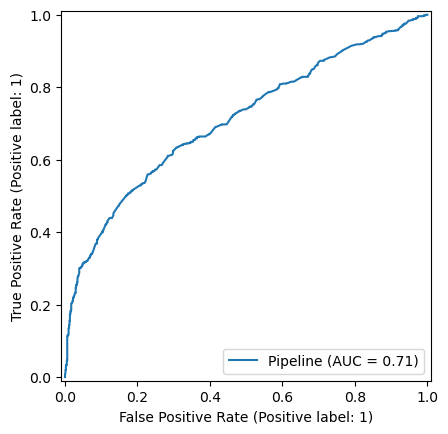

In [64]:
RocCurveDisplay.from_estimator(second_best_estimator,X_test, y_test)

AUC mewakili tingkat atau ukuran pemisahan antara kelas-kelas. Ini menggambarkan seberapa mampu model dalam membedakan antara kelas-kelas.

AUC sebesar 0.71 berarti ada kemungkinan sebesar 71% bahwa model akan mampu membedakan antara kelas positif dan kelas negatif.

## Modeling (Threshold Adjustment)

In [65]:
model=second_best_estimator
model.fit(X_train,y_train)

th_value=[i/100 for i in range(1,99)]
score=0
score_list=[]

for i in th_value:
    y_prob=model.predict_proba(X_test)[:,1]
    y_pred=np.where(y_prob>i,1,0)
    score_temp=f1_score(y_test,y_pred)
    score_list.append(score_temp)

th_f1 = pd.DataFrame({
    'th_value':th_value,
    "f1_score":score_list
})

th_f1=th_f1.sort_values("f1_score",ascending=False)

In [66]:
th_f1

,th_value,f1_score
33,0.34,0.656879
30,0.31,0.656457
29,0.30,0.655754
34,0.35,0.655500
27,0.28,0.653613
...,...,...
93,0.94,0.140915
94,0.95,0.091371
95,0.96,0.062096
96,0.97,0.039267


In [67]:
th_f1.head(1)["th_value"].values

array([0.34])

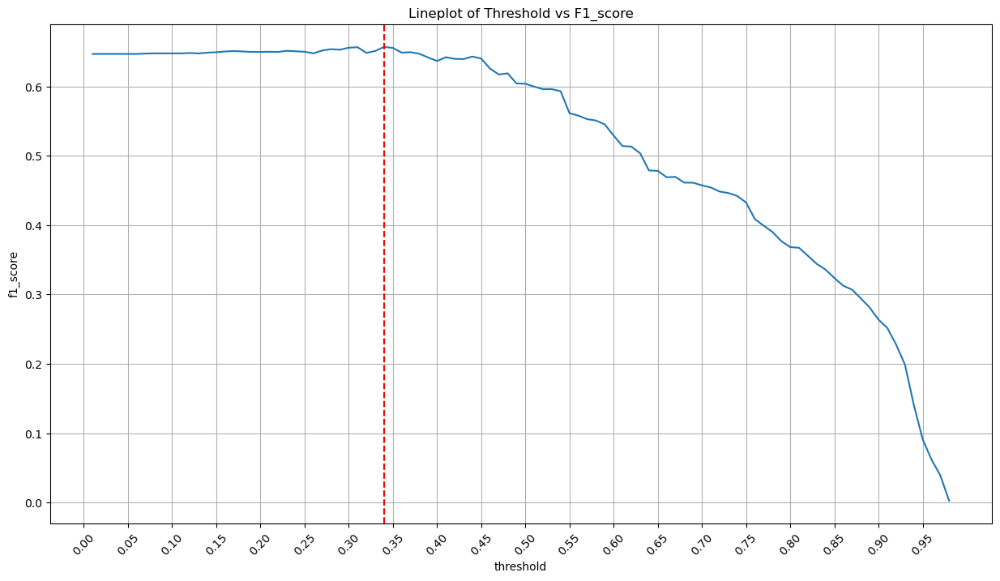

In [107]:
plt.figure(figsize=(15,8))
sns.lineplot(x=th_value,y=score_list)
plt.grid()
plt.xticks(np.arange(0,1,0.05),rotation=45)
plt.ylabel("f1_score")
plt.xlabel("threshold")
plt.title("Lineplot of Threshold vs F1_score")
plt.axvline(x=th_f1.head(1)["th_value"].values, linestyle='--',color='red')
plt.show()

In [69]:
y_prob=model.predict_proba(X_test)[:,1]
y_pred=np.where(y_prob>th_f1.head(1)["th_value"].values,1,0)

In [70]:
final_model_actual_pred_y = pd.DataFrame({
    "actual":y_test,
    "pred":y_pred
})
final_model_actual_pred_y 

,actual,pred
0,1,1
1,1,1
2,0,1
3,0,1
4,0,1
...,...,...
1558,1,1
1559,0,1
1560,1,1
1561,0,1


In [71]:
confusion_matrix_final= final_model_actual_pred_y.groupby("actual")["pred"].value_counts().reset_index()
confusion_matrix_final

,actual,pred,count
0,0,1,488
1,0,0,328
2,1,1,604
3,1,0,143


In [72]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.70      0.40      0.51       816
           1       0.55      0.81      0.66       747

    accuracy                           0.60      1563
   macro avg       0.62      0.61      0.58      1563
weighted avg       0.63      0.60      0.58      1563



Pada threshold adjustment, model lebih mampu memprediksi lebih baik dengan threshold sebesar 34%. Artinya jika nilai probabilitas prediksi diatas 34%, maka nilai akan diprediksi positif (melakukan deposit). 

Setelah penyesuaian fitur, hyperparameter tuning, dan threshold, diperoleh jumlah f1 score model adalah 0.66, mengindikasikan bahwa model memiliki keseimbangan yang cukup baik antara presisi dan recall, di mana model dapat memprediksi dengan akurat sekitar 66% dari kelas positif (pelanggan yang melakukan deposit), sambil meminimalkan jumlah false negatives.

Model memiliki nilai recall sebesar 0.81 menandakan dari semua kasus yang sebenarnya positif (pelanggan yang melakukan deposit), model mampu mengklasifikasikan sekitar 81% di antaranya dengan benar sebagai positif, sementara sisanya salah diklasifikasikan sebagai negatif (false negative). 

### Feature Evaluation

In [73]:
# Get the best estimator from GridSearchCV
best_estimator = second_best_estimator

# Get the SelectKBest transformer
select_k_best = best_estimator.named_steps['feature_selection']

# Get the selected features indices
selected_indices = select_k_best.get_support(indices=True)


# Get the transformer from the best estimator
transformer = best_estimator.named_steps['preprocessor']

# Get the feature names after transformation
feature_names = transformer.get_feature_names_out(input_features=X_train.columns)

# Transform X_train using the transformer
X_test_encoded = transformer.transform(X_test)
X_test_encoded = pd.DataFrame(X_test_encoded, columns=feature_names)


# Get the column names of the selected features
selected_features = X_test_encoded.columns[selected_indices]
selected_features

Index(['num__pdays', 'num__campaign', 'cat__job_blue-collar',
       'cat__job_retired', 'cat__job_services', 'cat__job_student',
       'cat__housing_no', 'cat__housing_yes', 'cat__loan_no', 'cat__loan_yes',
       'cat__poutcome_failure', 'cat__poutcome_other', 'cat__poutcome_success',
       'cat__poutcome_unknown', 'ordinal_c2__bin_balance'],
      dtype='object')

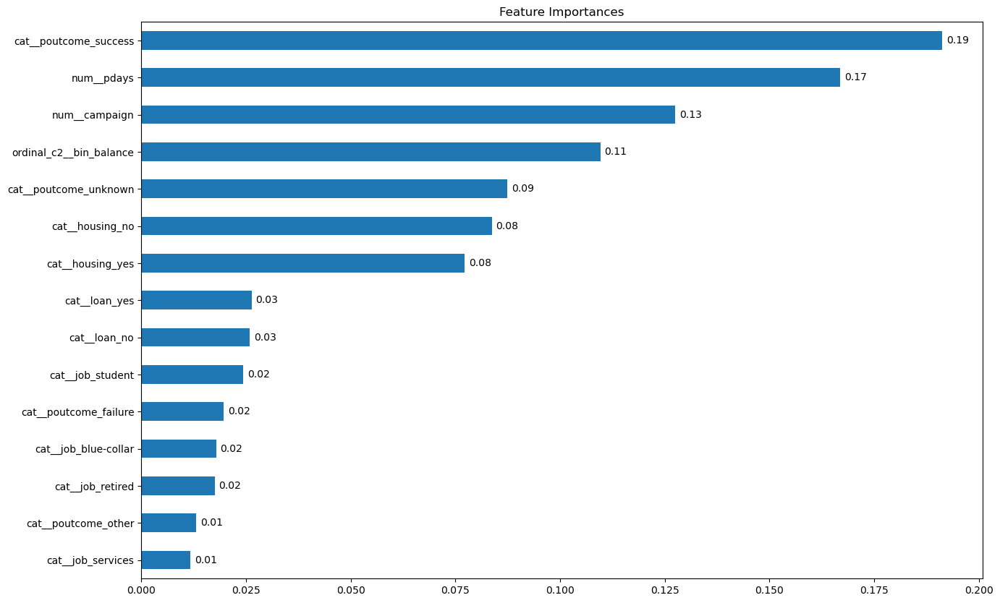

In [74]:
# Get the best estimator from GridSearchCV
best_estimator = second_best_estimator

# Access the final estimator in the pipeline
final_estimator = best_estimator.named_steps['classifier']

# Get the feature importances from the final estimator
feature_importances = final_estimator.feature_importances_

# Create a Series with feature importances and sort it
model_coef = pd.Series(feature_importances, index=selected_features).sort_values()

# Plot the feature importances
plt.figure(figsize=(15, 10))
ax = model_coef.plot(kind='barh', title='Feature Importances')

# Add annotations to the plot
for i in ax.patches:
    ax.text(i.get_width() + 0.001,  # position x (at the end of the bar)
            i.get_y() + i.get_height() / 2,  # position y (middle of the bar)
            f'{i.get_width():.2f}',  # text to display (feature importance value)
            ha='left',  # horizontal alignment (left align)
            va='center')  # vertical alignment (center align)
plt.show()


1. Model terbaik adalah model random forest classification dengan parameter (criterion='log_loss', max_depth=10, min_samples_leaf=4, min_samples_split=15, n_estimators=40) dan threshold pada 34%. Saya tidak memilih logistic regression dikarenakan dengan skor f1 yang sama dengan model random forest, model random forest memiliki std deviation yang lebih rendah. Artinya model random forest lebih konsisten dalam melakukan prediksi model ketika di fase training.

2. Fitur yang paling mempengaruhi model dari yang paling tinggi adalah:
- Kesuksesan performa kampanye sebelumnya pada masing - masing calon pelanggan (Poutcome == Success/failure)
- Lama hari terakhir kali calon pelanggan dihubungi oleh bank ABC dalam memberikan penawaran produk (pdays)
- Frekuensi tim pemasaran dalam menghubungi calon pelanggan (campaign)
- Jumlah saldo rekening di calon pelanggan (bin balance)
- Kepemilikan pinjaman rumah calon pelanggan (housing)
- Kepemilikan pinjaman dana pelanggan (loan)

Selain itu, terdapat kecendrungan calon pelanggan baru yang belum pernah dihubungi sebelumnya juga berpengaruh pada model (Poutcome == Unknown). Ada juga pengaruh jenis pekerjaan calon pelanggan (job == student/retired).

Untuk melihat hubungan fitur tersebut lebih jelas kita akan menganalisa lebih dalam terkait hubungan fitur terhadap label pada data train.

In [75]:
#impute fitur contact yang NaN dengan modus karena jumlah NaN values dibawah 50%
train["contact"].fillna(train["contact"].mode()[0],inplace=True)
train["job"].fillna(train["job"].mode()[0],inplace=True)
train.isna().sum()/len(train)

C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\1485679772.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train["contact"].fillna(train["contact"].mode()[0],inplace=True)
C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\1485679772.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as 

age            0.0
job            0.0
balance        0.0
housing        0.0
loan           0.0
contact        0.0
month          0.0
campaign       0.0
pdays          0.0
poutcome       0.0
deposit        0.0
bin_age        0.0
bin_balance    0.0
bin_pdays      0.0
dtype: float64

In [76]:
#impute fitur contact yang NaN dengan modus karena jumlah NaN values dibawah 50%
test["contact"].fillna(test["contact"].mode()[0],inplace=True)
test["job"].fillna(test["job"].mode()[0],inplace=True)
test.isna().sum()/len(test)

C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\1186972643.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  test["contact"].fillna(test["contact"].mode()[0],inplace=True)
C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\1186972643.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a 

age            0.0
job            0.0
balance        0.0
housing        0.0
loan           0.0
contact        0.0
month          0.0
campaign       0.0
pdays          0.0
poutcome       0.0
deposit        0.0
bin_age        0.0
bin_balance    0.0
bin_pdays      0.0
dtype: float64

In [77]:
group_bin_age = train.groupby("bin_age")["deposit"].value_counts(normalize=True).reset_index()
group_bin_age = group_bin_age[group_bin_age["deposit"]==1].drop("deposit",axis=1)
group_bin_age

C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\795965445.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_bin_age = train.groupby("bin_age")["deposit"].value_counts(normalize=True).reset_index()


,bin_age,proportion
0,<25 tahun,0.699219
3,25 - 40 tahun,0.463083
5,41 - 60 tahun,0.423686
6,>60 tahun,0.827586


In [78]:
group_bin_bal = train.groupby("bin_balance")["deposit"].value_counts(normalize=True).reset_index()
group_bin_bal = group_bin_bal[group_bin_bal["deposit"]==1].drop("deposit",axis=1)
group_bin_bal

C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\3692921917.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_bin_bal = train.groupby("bin_balance")["deposit"].value_counts(normalize=True).reset_index()


,bin_balance,proportion
1,1,0.350835
3,2,0.446141
5,3,0.471014
6,4,0.534400
8,5,0.588283


In [79]:
group_poutcome = train.groupby("poutcome")["deposit"].value_counts(normalize=True).reset_index()
group_poutcome = group_poutcome[group_poutcome["deposit"]==1].drop("deposit",axis=1)
group_poutcome

,poutcome,proportion
0,failure,0.537010
2,other,0.615132
4,success,0.915541
7,unknown,0.404598


In [80]:
group_job = train.groupby("job")["deposit"].value_counts(normalize=True).reset_index()
group_job = group_job[group_job["deposit"]==1].drop("deposit",axis=1)
group_job

,job,proportion
1,admin,0.477573
3,blue-collar,0.380445
5,entrepreneur,0.377660
7,housemaid,0.370629
8,management,0.511864
10,retired,0.665893
13,self-employed,0.460870
15,services,0.391544
16,student,0.755000
19,technician,0.463462


In [81]:
group_month = train.groupby("month")["deposit"].value_counts(normalize=True).reset_index()
group_month = group_month[group_month["deposit"]==1].drop("deposit",axis=1)
group_month

,month,proportion
0,apr,0.636190
3,aug,0.468966
4,dec,0.923077
6,feb,0.572115
9,jan,0.437158
11,jul,0.401442
13,jun,0.441894
14,mar,0.899371
17,may,0.332075
19,nov,0.432692


In [82]:
group_contact = train.groupby("contact")["deposit"].value_counts(normalize=True).reset_index()
group_contact = group_contact[group_contact["deposit"]==1].drop("deposit",axis=1)
group_contact

,contact,proportion
1,cellular,0.475870
2,telephone,0.505721


In [83]:
group_housing = train.groupby("housing")["deposit"].value_counts(normalize=True).reset_index()
group_housing = group_housing[group_housing["deposit"]==1].drop("deposit",axis=1)
group_housing

,housing,proportion
0,no,0.577704
3,yes,0.365895


In [84]:
group_loan = train.groupby("loan")["deposit"].value_counts(normalize=True).reset_index()
group_loan = group_loan[group_loan["deposit"]==1].drop("deposit",axis=1)
group_loan

,loan,proportion
0,no,0.501108
3,yes,0.326061


In [85]:
group_bin_pdays = train.groupby("bin_pdays")["deposit"].value_counts(normalize=True).reset_index()
group_bin_pdays = group_bin_pdays[group_bin_pdays["deposit"]==1].drop("deposit",axis=1)
group_bin_pdays

C:\Users\Yogga\AppData\Local\Temp\ipykernel_12484\3826825680.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_bin_pdays = train.groupby("bin_pdays")["deposit"].value_counts(normalize=True).reset_index()


,bin_pdays,proportion
1,1,0.434713
2,2,0.739837
4,3,0.566613


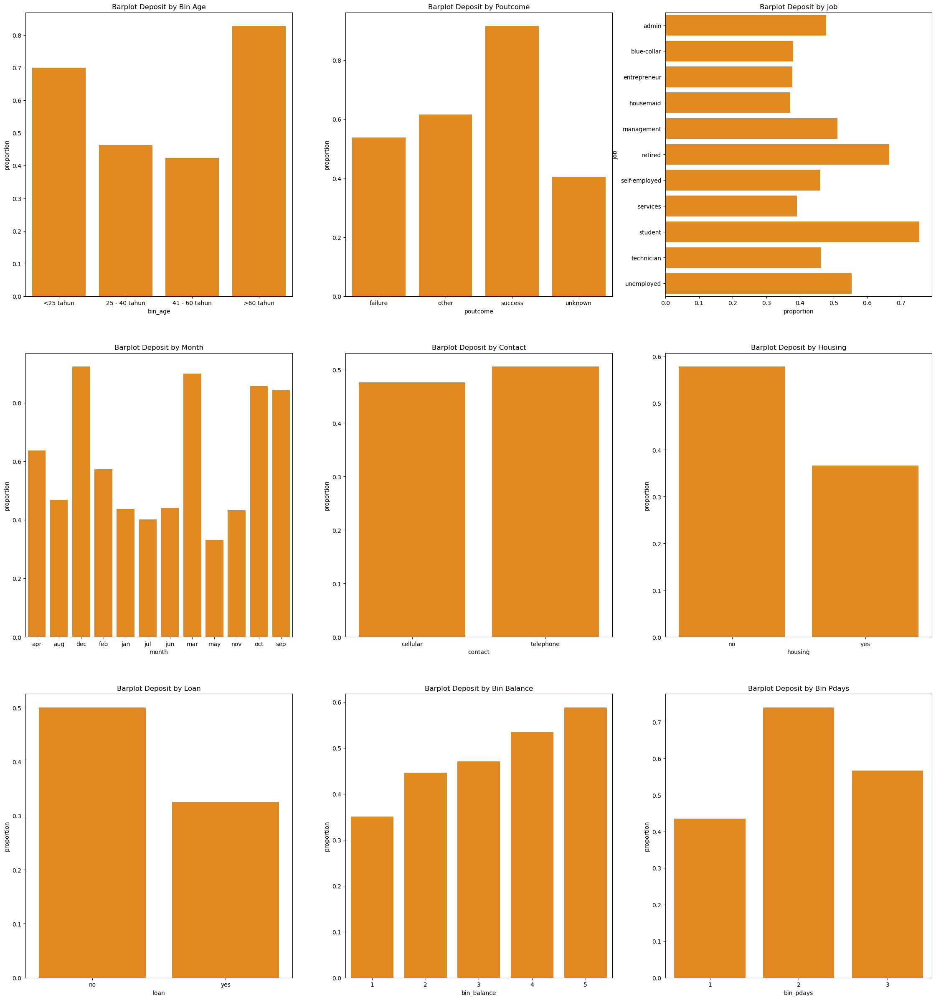

In [86]:
plt.figure(figsize=(28,30))

plt.subplot(3,3,1)
plt.title("Barplot Deposit by Bin Age")
sns.barplot(group_bin_age,x="bin_age",y="proportion",color='darkorange')

plt.subplot(3,3,2)
plt.title("Barplot Deposit by Poutcome")
sns.barplot(group_poutcome,x="poutcome",y="proportion",color='darkorange')

plt.subplot(3,3,3)
plt.title("Barplot Deposit by Job")
sns.barplot(group_job,y="job",x="proportion",color='darkorange')

plt.subplot(3,3,4)
plt.title("Barplot Deposit by Month")
sns.barplot(group_month,x="month",y="proportion",color='darkorange')


plt.subplot(3,3,5)
plt.title("Barplot Deposit by Contact")
sns.barplot(group_contact,x="contact",y="proportion",color='darkorange')

plt.subplot(3,3,6)
plt.title("Barplot Deposit by Housing")
sns.barplot(group_housing,x="housing",y="proportion",color='darkorange')

plt.subplot(3,3,7)
plt.title("Barplot Deposit by Loan")
sns.barplot(group_loan,x="loan",y="proportion",color='darkorange')

plt.subplot(3,3,8)
plt.title("Barplot Deposit by Bin Balance")
sns.barplot(group_bin_bal,x="bin_balance",y="proportion",color='darkorange')

plt.subplot(3,3,9)
plt.title("Barplot Deposit by Bin Pdays")
sns.barplot(group_bin_pdays,x="bin_pdays",y="proportion",color='darkorange')
plt.show()

In [87]:
# Transform X_train using the transformer
X_train_encoded = transformer.transform(X_train)
X_train_encoded = pd.DataFrame(X_train_encoded, columns=feature_names)
X_train_encoded

,num__pdays,num__campaign,num__age,cat__job_admin,cat__job_blue-collar,cat__job_entrepreneur,cat__job_housemaid,cat__job_management,cat__job_retired,cat__job_self-employed,...,cat__loan_no,cat__loan_yes,cat__contact_cellular,cat__contact_telephone,cat__poutcome_failure,cat__poutcome_other,cat__poutcome_success,cat__poutcome_unknown,ordinal_c2__bin_balance,month_encoder__month
0,0.000000,0.0,0.941176,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,6.0
1,0.000000,0.5,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0
2,9.943662,-0.5,0.705882,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4.0,5.0
3,0.000000,-0.5,-0.058824,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0
4,0.000000,1.0,-0.176471,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6234,0.000000,0.0,-0.352941,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0
6235,5.211268,0.0,0.529412,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0
6236,0.000000,3.0,-0.176471,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,8.0
6237,0.000000,-0.5,-0.470588,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,11.0


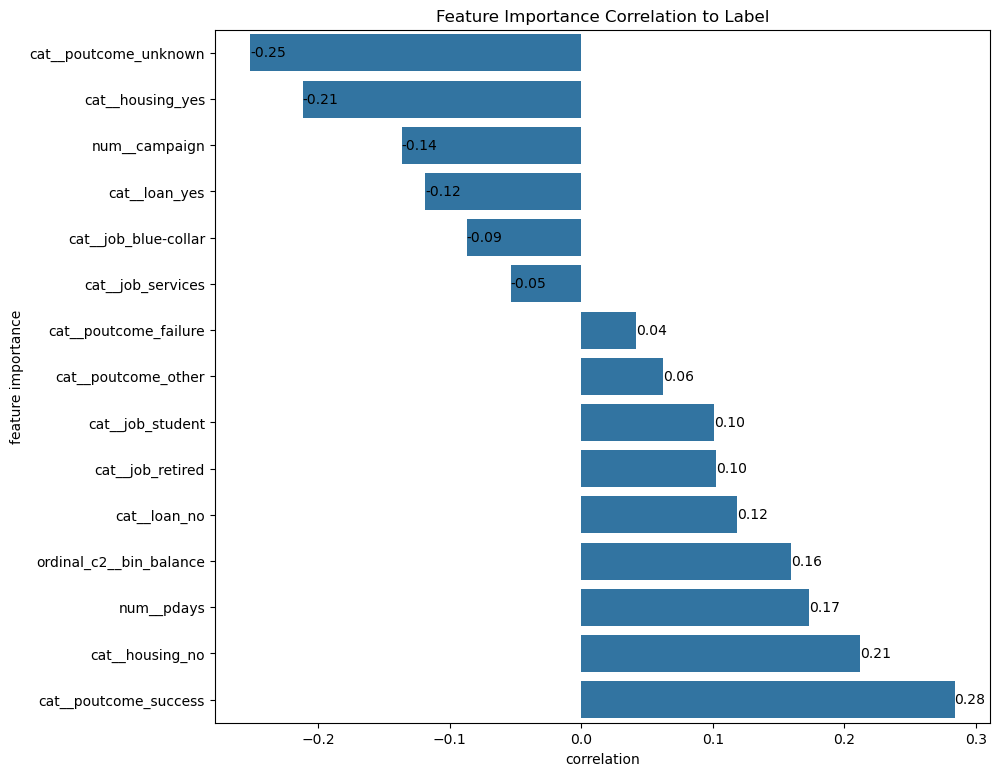

In [88]:
score = []
for i in X_train_encoded.columns:
    correlation = X_train_encoded[i].corr(y_train)
    score.append(correlation)

result = pd.DataFrame({
    "feature importance":X_train_encoded.columns,
    "correlation":score
}).sort_values("correlation")

result=result[result['feature importance'].isin(selected_features)]

plt.figure(figsize=(10,9))
plt.title("Feature Importance Correlation to Label")
sns.barplot(result, y="feature importance", x="correlation")

for index, value in enumerate(result["correlation"]):
    plt.text(value, index, f'{value:.2f}', color='black', ha="left", va="center")
    
plt.show()

Insights:
1. Kesuksesan kampanye pemasaran sebelumnya dapat berdampak positif terhadap kecendrungan pelanggan untuk melakukan deposit pada kampanye berikutnya. 
2. Calon pelanggan yang tidak memiliki pinjaman rumah, lebih cendrung ingin melakukan deposit
3. Pelanggan yang sudah lama tidak dihubungi sejak kampanye terakhir memiliki kecendrungan untuk melakukan deposit
4. Jumlah saldo yang semakin tinggi, memiliki kemungkinan untuk melakukan deposit
5. Pelanggan yang tidak memiliki pinjaman dana, lebih cendrung ingin melakukan deposit
6. Jika calon pelanggan adalah pelajar/pensiunan, memiliki kecendrungan lebih tinggi untuk melakukan deposit
7. Daftar kandidat calon pelanggan yang belum pernah dihubungi, memiliki kecendrungan untuk tidak melakukan deposit
8. Semakin sering pelanggan  dihubungi, lebih rendah kecendrungan mereka untuk melakukan deposit.


Kini kita telah mengetahui  fitur mana saja yang berpengaruh dan dampaknya kepada probabilitas model dalam memprediksi deposit atau tidak. 

Selanjutnya, kita akan membandingkan performa bisnis bank ABC jika mengimplementasikan model random forest dibandingkan menggunakan sistem tradisional yaitu rule based. 

### Rule Based

Rule Based adalah ebuah pendekatan dalam sistem pengambilan keputusan yang menggunakan serangkaian aturan untuk memprediksi atau mengklasifikasikan data.

Aturan - aturan tersebut menentukan jumlah skor pada tiap fitur variabel. Pada kasus ini, bank ABC akan menentukan skor berdasarkan proporsi pelanggan yang melakukan deposit berdasarkan tiap fitur pada dataset. Skor tersebut kemudian akan diakumulasikan untuk semua fitur menjadi total skor. Jika total skor lebih tinggi dibandingkan rata rata total skor pada train data, maka pelanggan akan diprediksi melakukan deposit.

In [89]:
# Scorecard modeling

#bin_age
rule_based_test = pd.merge(test, group_bin_age, on='bin_age', how='inner').rename(columns={"proportion":"score_bin_age"})

#poutcome
rule_based_test = pd.merge(rule_based_test, group_poutcome, on='poutcome', how='inner').rename(columns={"proportion":"score_poutcome"})

#job
rule_based_test = pd.merge(rule_based_test, group_job, on='job', how='inner').rename(columns={"proportion":"score_job"})

#month
rule_based_test = pd.merge(rule_based_test, group_month, on='month', how='inner').rename(columns={"proportion":"score_month"})

#contact
rule_based_test = pd.merge(rule_based_test, group_contact, on='contact', how='inner').rename(columns={"proportion":"score_contact"})

#housing
rule_based_test = pd.merge(rule_based_test, group_housing, on='housing', how='inner').rename(columns={"proportion":"score_housing"})

#loan
rule_based_test = pd.merge(rule_based_test, group_loan, on='loan', how='inner').rename(columns={"proportion":"score_loan"})

#bin_balance
rule_based_test = pd.merge(rule_based_test, group_bin_bal, on='bin_balance', how='inner').rename(columns={"proportion":"score_bin_balance"})

#bin_pdays
rule_based_test = pd.merge(rule_based_test, group_bin_pdays, on='bin_pdays', how='inner').rename(columns={"proportion":"score_bin_pdays"})

rule_based_test = rule_based_test.iloc[:,14:]
rule_based_test["total_score"] = rule_based_test.sum(axis=1)
rule_based_test

,score_bin_age,score_poutcome,score_job,score_month,score_contact,score_housing,score_loan,score_bin_balance,score_bin_pdays,total_score
0,0.463083,0.404598,0.370629,0.899371,0.475870,0.365895,0.501108,0.534400,0.434713,4.449669
1,0.463083,0.404598,0.511864,0.899371,0.475870,0.577704,0.501108,0.588283,0.434713,4.856595
2,0.463083,0.404598,0.391544,0.437158,0.475870,0.577704,0.501108,0.350835,0.434713,4.036615
3,0.423686,0.537010,0.391544,0.332075,0.475870,0.365895,0.501108,0.588283,0.566613,4.182086
4,0.423686,0.404598,0.463462,0.401442,0.475870,0.365895,0.501108,0.534400,0.434713,4.005175
...,...,...,...,...,...,...,...,...,...,...
1558,0.423686,0.915541,0.477573,0.441894,0.475870,0.577704,0.501108,0.471014,0.434713,4.719103
1559,0.463083,0.404598,0.380445,0.437158,0.505721,0.577704,0.501108,0.446141,0.434713,4.150672
1560,0.827586,0.404598,0.665893,0.468966,0.475870,0.577704,0.501108,0.534400,0.434713,4.890839
1561,0.423686,0.537010,0.477573,0.855895,0.475870,0.365895,0.326061,0.471014,0.739837,4.672842


In [90]:
# Scorecard modeling

#bin_age
rule_based_train = pd.merge(train, group_bin_age, on='bin_age', how='inner').rename(columns={"proportion":"score_bin_age"})

#poutcome
rule_based_train = pd.merge(rule_based_train, group_poutcome, on='poutcome', how='inner').rename(columns={"proportion":"score_poutcome"})

#job
rule_based_train = pd.merge(rule_based_train, group_job, on='job', how='inner').rename(columns={"proportion":"score_job"})

#month
rule_based_train = pd.merge(rule_based_train, group_month, on='month', how='inner').rename(columns={"proportion":"score_month"})

#contact
rule_based_train = pd.merge(rule_based_train, group_contact, on='contact', how='inner').rename(columns={"proportion":"score_contact"})

#housing
rule_based_train = pd.merge(rule_based_train, group_housing, on='housing', how='inner').rename(columns={"proportion":"score_housing"})

#loan
rule_based_train = pd.merge(rule_based_train, group_loan, on='loan', how='inner').rename(columns={"proportion":"score_loan"})

#bin_balance
rule_based_train = pd.merge(rule_based_train, group_bin_bal, on='bin_balance', how='inner').rename(columns={"proportion":"score_bin_balance"})

#bin_pdays
rule_based_train = pd.merge(rule_based_train, group_bin_pdays, on='bin_pdays', how='inner').rename(columns={"proportion":"score_bin_pdays"})

rule_based_train = rule_based_train.iloc[:,14:]
rule_based_train["total_score"] = rule_based_train.sum(axis=1)
rule_based_train

,score_bin_age,score_poutcome,score_job,score_month,score_contact,score_housing,score_loan,score_bin_balance,score_bin_pdays,total_score
0,0.423686,0.404598,0.477573,0.441894,0.475870,0.577704,0.501108,0.534400,0.434713,4.271546
1,0.463083,0.404598,0.460870,0.636190,0.475870,0.365895,0.326061,0.350835,0.434713,3.918116
2,0.423686,0.615132,0.477573,0.332075,0.475870,0.577704,0.501108,0.588283,0.566613,4.558044
3,0.463083,0.404598,0.391544,0.332075,0.475870,0.365895,0.501108,0.350835,0.434713,3.719723
4,0.463083,0.404598,0.370629,0.432692,0.505721,0.365895,0.501108,0.446141,0.434713,3.924582
...,...,...,...,...,...,...,...,...,...,...
6234,0.463083,0.404598,0.511864,0.332075,0.475870,0.365895,0.326061,0.350835,0.434713,3.664996
6235,0.423686,0.915541,0.370629,0.572115,0.475870,0.577704,0.501108,0.588283,0.739837,5.164774
6236,0.463083,0.404598,0.511864,0.468966,0.475870,0.577704,0.501108,0.446141,0.434713,4.284048
6237,0.463083,0.404598,0.477573,0.432692,0.475870,0.365895,0.501108,0.350835,0.434713,3.906368


In [91]:
rule_based_train["total_score"].mean()

4.301650905593845

Rata rata total skor pada data train adalah 4.3016, sekarang kita akan memprediksi data test berdasarkan rata rata pada data train.

In [92]:
rule_based_test["pred"]=np.where(rule_based_test["total_score"] <= rule_based_train["total_score"].mean(),0,1)
rule_based_test

,score_bin_age,score_poutcome,score_job,score_month,score_contact,score_housing,score_loan,score_bin_balance,score_bin_pdays,total_score,pred
0,0.463083,0.404598,0.370629,0.899371,0.475870,0.365895,0.501108,0.534400,0.434713,4.449669,1
1,0.463083,0.404598,0.511864,0.899371,0.475870,0.577704,0.501108,0.588283,0.434713,4.856595,1
2,0.463083,0.404598,0.391544,0.437158,0.475870,0.577704,0.501108,0.350835,0.434713,4.036615,0
3,0.423686,0.537010,0.391544,0.332075,0.475870,0.365895,0.501108,0.588283,0.566613,4.182086,0
4,0.423686,0.404598,0.463462,0.401442,0.475870,0.365895,0.501108,0.534400,0.434713,4.005175,0
...,...,...,...,...,...,...,...,...,...,...,...
1558,0.423686,0.915541,0.477573,0.441894,0.475870,0.577704,0.501108,0.471014,0.434713,4.719103,1
1559,0.463083,0.404598,0.380445,0.437158,0.505721,0.577704,0.501108,0.446141,0.434713,4.150672,0
1560,0.827586,0.404598,0.665893,0.468966,0.475870,0.577704,0.501108,0.534400,0.434713,4.890839,1
1561,0.423686,0.537010,0.477573,0.855895,0.475870,0.365895,0.326061,0.471014,0.739837,4.672842,1


In [93]:
rule_based_test["pred"].value_counts()

pred
0    934
1    629
Name: count, dtype: int64

In [94]:
test["deposit"].value_counts()

deposit
0    816
1    747
Name: count, dtype: int64

In [95]:
f1_score(test["deposit"],rule_based_test["pred"])

0.6409883720930233

In [96]:
confussion_matrix_rulebased=pd.DataFrame({
    'actual': test["deposit"],
    'pred': rule_based_test["pred"]
}).value_counts().reset_index()

confussion_matrix_rulebased

,actual,pred,count
0,0,0,628
1,1,1,441
2,1,0,306
3,0,1,188


Rule Based model memiliki nilai f1_score lebih tinggi dibandingkan random forest. Namun kita akan menganalisa lebih dalam kemampuan rule based dan model based melalui evaluasi business outcome.

### Business Outcome Evaluation - Rule Based vs Model Based

In [97]:
print("Random Forest Classification:")
print(classification_report(y_test,y_pred))
display(confusion_matrix_final.sort_values(by=["actual","pred"],ascending=[False,False]))
print("\n\nRule Based:")
print(classification_report(test["deposit"],rule_based_test["pred"]))
display(confussion_matrix_rulebased.sort_values(by=["actual","pred"],ascending=[False,False]))

Random Forest Classification:
              precision    recall  f1-score   support

           0       0.70      0.40      0.51       816
           1       0.55      0.81      0.66       747

    accuracy                           0.60      1563
   macro avg       0.62      0.61      0.58      1563
weighted avg       0.63      0.60      0.58      1563



,actual,pred,count
2,1,1,604
3,1,0,143
0,0,1,488
1,0,0,328




Rule Based:
              precision    recall  f1-score   support

           0       0.67      0.77      0.72       816
           1       0.70      0.59      0.64       747

    accuracy                           0.68      1563
   macro avg       0.69      0.68      0.68      1563
weighted avg       0.69      0.68      0.68      1563



,actual,pred,count
1,1,1,441
2,1,0,306
3,0,1,188
0,0,0,628


1. **Peluang Pemasukan Dana Deposito**

Model Klasifikasi Random Forest dapat lebih efektif dalam memprediksi calon pelanggan yang akan melakukan deposito dibandingkan dengan metode berbasis aturan (Rule Based). Hal ini dapat dilihat dari perbandingan nilai True Positive pada Confusion Matrix. Jika kita mengasumsikan minimal penempatan awal deposito di bank tersebut adalah Rp8.000.000, maka bank dapat mengumpulkan dana sebesar Rp5.112.000.000 dengan Model Klasifikasi Random Forest, dibandingkan dengan Rp3.480.000.000 menggunakan metode berbasis aturan (**peningkatan sebesar 38,8% dengan Model Klasifikasi Random Forest**).<br>

**Random Forest Classification:**

Rp8.000.000 x 604 = **Rp4.832.000.000**

**Rule Based:**

Rp8.000.000 x 441 = **Rp3.480.000.000**
<br>
<br>
<br>
<br>
<br>
2. **Peluang Opportunity Cost**

Model Klasifikasi Random Forest lebih mampu mengatasi error tipe 2, dengan kata lain model mampu untuk mengurangi peluang kesalahan memprediksi calon pelanggan yang diprediksi tidak melakukan deposit padahal kenyataannya calon pelanggan ingin untuk melakukan deposit dibandingkan metode Rule Based. Hal ini dapat dilihat dari perbandingan nilai False Negative pada Confusion Matrix dan nilai recall yang lebih tinggi pada model Random Forest (sebesar 86%). Jika kita mengasumsikan minimal penempatan awal deposito di bank tersebut adalah Rp8.000.000, maka bank berpeluang kehilangan dana sebesar Rp864.000.000 dengan Model Klasifikasi Random Forest, dibandingkan dengan Rp2.496.000.000 menggunakan metode Rule Based (**penurunan sebesar 45,83% dengan Model Klasifikasi Random Forest**).

**Random Forest Classification:**

Rp8.000.000 x 143 = **Rp1.144.000.000** 

**Rule Based:**

Rp8.000.000 x 306 = **Rp2.496.000.000**
<br>
<br>
<br>
<br>
<br>
3.  **Peluang Biaya Sia-Sia**

Model Rule Based lebih mampu untuk mengatasi error tipe 1, dengan kata lain model mampu untuk mengurangi peluang kesalahan memprediksi calon pelanggan yang diprediksi akan melakukan deposit padahal kenyataannya calon pelanggan tidak berminat untuk melakukan deposit dibandingkan Model Klasifikasi. Hal ini dapat dilihat dari perbandingan nilai False Positive pada Confussion Matrix dan nilai precision yang lebih tinggi pada model Rule Based (sebesar 71%). Jika kita mengasumsikan biaya pemasaran adalah 1% dari nilai minimal penempatan awal deposito (Rp8.000.000 * 1% = Rp80.000), maka bank berpeluang untuk mengeluarkan biaya sebesar  Rp40.560.000 dengan Model Klasifikasi Random Forest, dibandingkan dengan Rp14.000.000 menggunakan metode Rule Based (**penurunan sebesar 35,86% dengan Model Rule Based**)

**Random Forest Classification:**

Rp80.000 x 488 = **Rp39.040.000** 

**Rule Based:**

Rp80.000 x 188 = **Rp14.000.000**
<br>
<br>
<br>
<br>
<br>
4. **Peluang Keuntungan Kotor**

Dari ketiga perhitungan diatas, kita dapat memperkirakan keuntungan kotor dari implementasi kedua model dengan mengurangi peluang pemasukan dana deposito terhadap biaya opportunity cost dan biaya sia-sia. Model Klasifikasi Random Forest memiliki peluang keuntungan kotor sebesar Rp4.207.440.000 dibandingkan Model Rule Based sebesar Rp970.000.000. (**Model Klasifikasi Random Forest 376% lebih tinggi**)

**Random Forest Classification:**

Peluang pemasukan dana deposito: Rp4.832.000.000

Peluang kehilangan dana (opportunity cost): Rp1.144.000.000

Peluang biaya pemasaran yang sia-sia: Rp39.040.000

Keuntungan kotor = Rp4.832.000.000 - Rp1.144.000.000 - Rp39.040.000 = **Rp3.648.960.000**


**Random Forest Classification:**

Peluang pemasukan dana deposito: Rp3.480.000.000

Peluang kehilangan dana (opportunity cost): Rp2.496.000.000

Peluang biaya pemasaran yang sia-sia: Rp14.000.000

Keuntungan kotor = Rp3.480.000.000 - Rp2.496.000.000 - Rp14.000.000 = **Rp970.000.000**
<br>
<br>
<br>
<br>
<br>
5. **Kesimpulan Akhir**

Dalam perbandingan antara Model Klasifikasi Random Forest dan Model Rule Based, Random Forest terbukti lebih efektif dalam mengoptimalkan prediksi True Positive dan mengurangi False Negative secara signifikan. Di sisi lain, Model Rule Based lebih unggul dalam memprediksi True Negative dan mengurangi peluang False Positive.

Implikasinya terhadap profitabilitas bank sangat signifikan. Dengan menggunakan Model Klasifikasi Random Forest, bank dapat meningkatkan keuntungan kotor hingga 376% dibandingkan dengan metode rule based. Oleh karena itu, berdasarkan hasil analisis, Model Klasifikasi Random Forest lebih direkomendasikan untuk diimplementasikan pada bank ABC.

### Model Constraints

Kita telah mengetahui bahwa model based jauh lebih baik terhadap performa bisnis. Dikarenakan model ini hasil dari pelatihan pada data Train, model hanya dapat bekerja dengan baik pada rentan tertentu. Berikut adalah batasan data yang dapat diterima oleh model untuk memprediksi.

In [98]:
train.describe()

,age,balance,campaign,pdays,deposit
count,6239.000000,6239.000000,6239.000000,6239.000000,6239.000000
mean,41.182722,1483.274082,2.522199,51.733611,0.477961
std,11.909416,2809.774896,2.600980,108.867730,0.499554
min,18.000000,-3058.000000,1.000000,-1.000000,0.000000
25%,32.000000,132.500000,1.000000,-1.000000,0.000000
50%,39.000000,546.000000,2.000000,-1.000000,0.000000
75%,49.000000,1671.500000,3.000000,34.500000,1.000000
max,95.000000,37127.000000,33.000000,854.000000,1.000000


In [99]:
#Melihat unique values pada data train
pd.set_option('display.max_colwidth', None)

columns = ['job', 'housing', 'loan', 'contact', 'month','poutcome']
values = []
nunique_list = []
for i in columns:
    value = train[i].unique()
    nunique = train[i].nunique()
    nunique_list.append(nunique)
    values.append(value)

display(
    pd.DataFrame({
    "columns" : columns,
    "values" : values,
    "nunique": nunique_list
})
       )
pd.reset_option('display.max_colwidth')

,columns,values,nunique
0,job,"[admin, self-employed, services, housemaid, technician, management, student, blue-collar, entrepreneur, retired, unemployed]",11
1,housing,"[no, yes]",2
2,loan,"[no, yes]",2
3,contact,"[cellular, telephone]",2
4,month,"[jun, apr, may, nov, jan, sep, feb, aug, jul, oct, mar, dec]",12
5,poutcome,"[unknown, other, failure, success]",4


Model hanya dapat bekerja dengan baik jika data yang diuji memenuhi kriteria berikut:

| Kriteria  | Rentang Nilai                        | Nilai yang Diperbolehkan                                                                                                    |
|-----------|--------------------------------------|-----------------------------------------------------------------------------------------------------------------------------|
| Usia      | 18 - 95                              | -                                                                                                                           |
| Balance   | (-3058) - 37127                        | -                                                                                                                           |
| Campaign  | 1 - 33                               | -                                                                                                                           |
| Pdays     | (-1) - 854                             | -                                                                                                                           |
| Job       | -                                    | admin, self-employed, services, housemaid, technician, management, student, blue-collar, entrepreneur, retired, unemployed |
| Housing   | -                                    | no, yes                                                                                                                     |
| Loan      | -                                    | no, yes                                                                                                                     |
| Contact   | -                                    | cellular, telephone                                                                                                         |
| Month     | -                                    | jan, feb, mar, apr, may, jun, jul, aug, sep, oct, nov, dec                                                                  |
| Poutcome  | -                                    | unknown, other, failure, success                                                                                            |


# <span style="color:RoyalBlue"> 5. Conclusion & Recommendation </span>

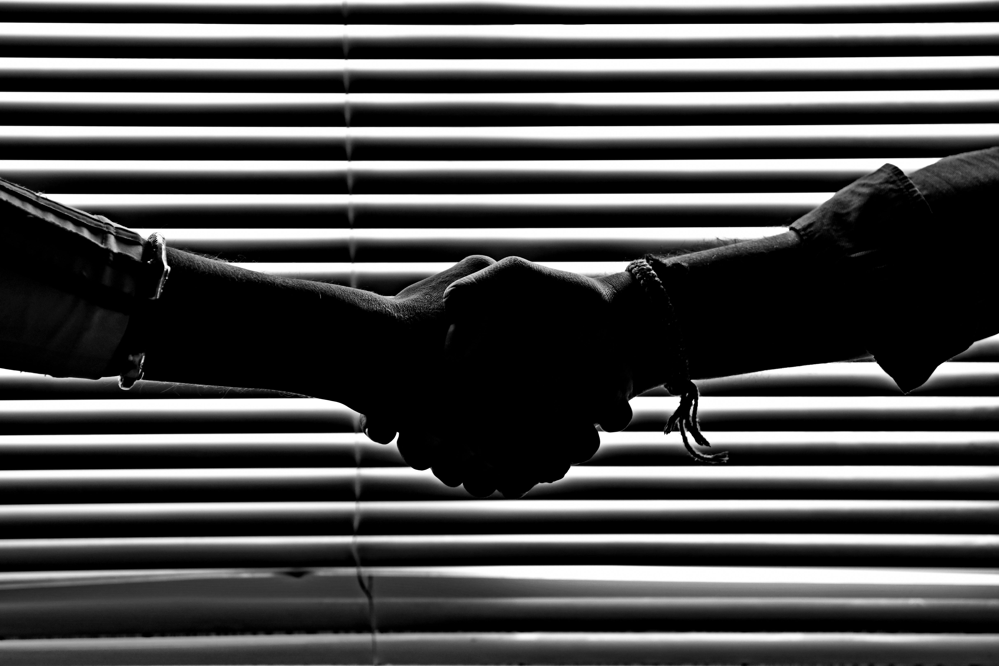

### CONCLUSION

Model Random Forest Classifier dengan hyperparameter tuning dan threshold memiliki performa yang lebih baik dalam memprediksi kemungkinan calon pelanggan akan melakukan deposit dengan hanya menggunakan 15 fitur setelah melalui tahap data preprocessing dibandingkan menggunakan metode rule based. Hal ini dapat terlihat dari nilai f1 score yang lebih tinggi pada model (0.66) dibandingkan rule based (0.64). Nilai tersebut menandakan model mampu untuk menyeimbangkan nilai recall dan precision yang lebih baik. Hal ini berdampak pada performa bisnis dimana dengan menggunakan model, bank ABC mampu untuk mencetak pendapatan kotor dari deposit sebesar Rp3.648.960.000, 376% lebih tinggi dibandingkan menggunakan rule based. 

### RECOMMENDATION

**Business Recommendation**

Model Klasifikasi Random Forest yang telah disusun dapat menjadi alat yang efektif bagi tim pengembangan bisnis Bank ABC untuk meramalkan calon pelanggan yang paling mungkin melakukan deposit di bank tersebut. Dengan menggunakan model ini sebagai panduan, diharapkan tim dapat mengalokasikan waktu dan sumber daya mereka dengan lebih efisien kepada calon pelanggan yang memiliki potensi lebih besar. Misalnya, mereka dapat lebih sering menghubungi calon pelanggan yang memiliki peluang lebih tinggi, membuat janji temu lebih banyak dengan calon pelanggan yang tepat, dan memberikan promosi yang lebih sesuai dengan kebutuhan calon pelanggan yang berpotensi.

Berdasarkan model random forest yang dipilih, beberapa faktor fitur yang paling mempengaruhi kemampuan model dalam memprediksi kecenderungan pelanggan untuk melakukan deposit pada kampanye pemasaran berikutnya telah diidentifikasi. 
1. Kesuksesan kampanye pemasaran sebelumnya memiliki dampak positif terhadap kecenderungan pelanggan untuk melakukan deposit pada kampanye berikutnya. 
2. Calon pelanggan yang tidak memiliki pinjaman rumah cenderung lebih ingin melakukan deposit.
3. Pelanggan yang sudah lama tidak dihubungi sejak kampanye terakhir memiliki kecenderungan untuk melakukan deposit. 
4. Jumlah saldo yang semakin tinggi juga meningkatkan kemungkinan pelanggan untuk melakukan deposit. 
5. Pelanggan yang tidak memiliki pinjaman dana lebih cenderung untuk melakukan deposit. 
6. Jika calon pelanggan adalah pelajar atau pensiunan, mereka memiliki kecenderungan yang lebih tinggi untuk melakukan deposit.
7. Daftar kandidat calon pelanggan yang belum pernah dihubungi cenderung untuk tidak melakukan deposit.
8. Semakin sering pelanggan dihubungi, semakin rendah kecenderungan mereka untuk melakukan deposit.


**Model Improvement Recommendation**

Data hasil pemasaran sangat penting untuk meningkatkan kinerja model. Oleh karena itu, untuk kampanye pemasaran berikutnya, tim pengembangan bisnis disarankan untuk memasukkan data dengan lebih detail ke dalam sistem. Sebagai contoh, memasukkan hasil kampanye sebagai sukses atau gagal tanpa memasukkan nilai lainnya. Dengan cara ini, model dapat belajar lebih efektif dari data yang ada, yang pada akhirnya akan meningkatkan akurasi dalam memprediksi peluang calon pelanggan yang melakukan deposit di Bank ABC.

Selain itu, dapat dicoba juga untuk menguji jenis model lain yang belum diuji pada dokumentasi ini, contohnya seperti model adaboost, catboost, atau deeplearning. Tujuannya adalah agar dapat menemukan jenis model lain yang lebih efektif untuk meningkatkan f1 score model.

### Fit Final Model & Saving

In [100]:
#Concat train and test features data
data_final_model_X = pd.concat([X_train,X_test])
data_final_model_X

,age,job,housing,loan,contact,month,campaign,pdays,poutcome,bin_balance
0,55,admin,no,no,cellular,jun,2,-1,unknown,4
1,39,self-employed,yes,yes,cellular,apr,3,-1,unknown,1
2,51,admin,no,no,cellular,may,1,352,other,5
3,38,services,yes,no,cellular,may,1,-1,unknown,1
4,36,housemaid,yes,no,telephone,nov,4,-1,unknown,2
...,...,...,...,...,...,...,...,...,...,...
1558,55,admin,no,no,cellular,jun,3,90,success,3
1559,26,blue-collar,no,no,telephone,jan,1,-1,unknown,2
1560,72,retired,no,no,cellular,aug,1,-1,unknown,4
1561,52,admin,yes,yes,cellular,oct,2,96,failure,3


In [101]:
#Concat train and test label data
data_final_model_y = pd.concat([y_train,y_test])
data_final_model_y

0       1
1       1
2       1
3       0
4       0
       ..
1558    1
1559    0
1560    1
1561    0
1562    1
Name: deposit, Length: 7802, dtype: int32

In [102]:
# Get the best estimator from GridSearchCV
best_estimator = second_best_estimator

#Fit model ke fitur data train dan test yang sudah disatukan dan label data train dan test yang telah disatukan
best_estimator.fit(data_final_model_X,data_final_model_y)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['pdays', 'campaign', 'age']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['job', 'hou...loan',
                                                   'contact', 'poutcome']),
                                                 ('ordinal_c2',
                                                  OrdinalEncoder(categories=[['1',
                                                                              '2',
                                                                              '3',
                                                                              '4',
                                                                              '5']]),
                                                  ['bin_balance']),
                                                 ('month_encoder',
                                                  MonthLabelEncoder(),
                                                  ['month'])])),
                ('feature_selection', SelectKBest(k=15)),
                ('classifier',
                 RandomForestClassifier(criterion='log_loss', max_depth=10,
                                        min_samples_leaf=4,
                                        min_samples_split=15, n_estimators=40,
                                        random_state=2020))])

In [103]:
import pickle

In [104]:
#Saving models

filename = 'Model Final.sav'

## Uncomment code dibawah untuk saving file model

# pickle.dump(best_estimator,open(filename,'wb'))